<img style="float:left" width="70%" src="../../documentacion/imagenes/escudo_COLOR_1L_DCHA.png">
<img style="float:right" width="10%" src="../../documentacion/imagenes/PythonLogo.svg">
<br style="clear:both;">


<h2 style="display: inline-block; padding: 4mm; padding-left: 2em; background-color: navy; line-height: 1.3em; color: white; border-radius: 10px;">TFG GII_O_MA_23.37</h2>


 
## Estudiante:

- Jose Luis Perez Gomez


# Descripción del Proyecto

El área de conocimiento de Ingeniería de Sistemas y Automática de la UBU dispone de un interfaz BCI (Brain Computer Interface) para la captación de señales cerebrales. Empleando ese interfaz se han realizado diferentes experimentos que han permitido recoger información de la actividad cerebral mientras un usuario ejecutaba diferentes tareas cotidianas. El TFG tiene como objetivo el análisis de la información obtenida en esos experimentos. Se entrarán diferentes algoritmos para clasificar la acción realizada por el usuario a partir de las señales generadas por el BCI. Con este propósito, se evaluarán diferentes algoritmos de procesado de señales y de machine learning para la clasificación automática de señales. Este proyecto se realizará en colaboración con el Área de Ingeniería de Sistemas y Automática de la UBU.

"Identifying motor imagery activities in brain computer interfaces based on the intelligent selection of most informative timeframe"
https://link.springer.com/article/10.1007/s42452-020-2020-0


Para realizar el trabajo voy a seguir los siguientes pasos:

1. Creacion de un entorno virtual.
2. Instalación de bibliotecas (!pip install ...)
3. Importaciónes de bibliotecas:
    Manipulación de datos: numpy, pandas, ...
    Manipulación de gráficos: seaborn, matplotlib, etc 
    Implementación de modelos de machine learning: sklearn, tensorflow, keras, ...
    Algoritmos de cálculo y optimización: scipy, ...
4. Asignar valores a varibles y crear funciones. 
5. Carga de datos y análisis descriptivo de variables (tipos, rangos, descripción textual de qué es cada uno, ...)
6. Preprocesado del conjunto de datos (estandarización, eliminación de outliers, rellenar filas con datos faltantes, ...)
7. Implementación de modelos de machine learning (Hold-Out, K-Fold cross validation, ...)
8. Implementación de modelos de deep learning (redes neuronales recurrentes)
9. Comportamiento de modelos SRNN y LSTM con generacion de datos sintéticos
10. Análisis de resultados y elección del mejor modelo.

# Las siguientes celdas son llamadas a Notebooks preparatorios del entorno para posteriormente poder ejecutar los analisis del conjunto de datos: 

## 1. Crear un entorno virtual

Crear un entorno virtual tiene varios beneficios: 

1. Aislo dependencias: 
    Puedo instalar bibliotecas y paquetes especificos para el proyecto evitando conflictos entre versiones de paquetes.
    

2. Reproducibilidad:
    Se puede reproducir el entorno del proyecto en diferentes ordenadores sin pensar en las dependencias asociadas a los
    paquetes.
    

3. Facilidad de gestión: 
    Se puede instalar, actualizar o eliminar paquetes sin afectar a otros proyectos o al sistema de Notebooks de Python



In [27]:
!pip install virtualenv
!python -m venv GII_O_MA_23.37
!GII_O_MA_23.37\Scripts\activate


## 2. Instalación de bibliotecas

Una biblioteca es un conjunto de funciones, clases y constantes que están agrupadas y organizadas para realizar tareas específicas. 
Con las bibliotecas se amplian las capacidades del lenguaje y esto da una gran variedad de tareas nuevas. Llamando al notebook Bibliotecas.ipynb instalo las librerias necesarias para el proyecto.

In [28]:
%run 2.Bibliotecas.ipynb

## 3. Importación de las bibliotecas instaladas

Una importacion es una  declaración que permite acceder a una funcionalidad definida de un módulo o uan biblioteca. 
Una vez hecha la declaracion se puede acceder a ella en cualquien momento del codigo sin tener que relizar la importacion de nuevo.

In [29]:
%run 3.Importaciones.ipynb


## 4. Asignación de valores a variables y creación de funciones

Asigno valores a variables para que puedan ser utilizadas en cualquien momento del codigo, de esta manera, no hay que volver a definirlas y tambien se estandarizan las ejecuciones

In [31]:
%run 4.VariablesClases.ipynb

# Carga de archivo CSV con el conjunto de datos a analizar:

In [32]:
%run SubirCSV.ipynb

FileUpload(value=(), accept='.csv', description='Upload')

Output()

Button(description='Procesar datos', disabled=True, style=ButtonStyle())

Output()

# Notebooks análisis y preprocessing de conjunto de datos:

In [33]:
inicio_tiempo = time.time()

## 5. Análisis de datos inicial

,Timestamp,Attention,Meditation,Delta,Theta,LowAlpha,HighAlpha,LowBeta,HighBeta,LowGamma,HighGamma,Signal,Key
0,54127,84,48,25253,14225,3441,4172,1881,9630,6863,5745,0,LButton
1,55056,78,60,4946,5021,8879,13002,879,6367,4314,3150,0,NaN
2,56038,66,75,102896,14838,12817,8565,2890,14525,9144,23072,0,NaN
3,57043,61,87,57763,12541,6173,5120,3238,10192,9048,6663,0,NaN
4,58203,37,84,21560,74162,11297,9217,4844,1945,2644,1678,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
721,348567,81,37,4088,13782,756,5536,7114,24230,12942,14061,0,Right
722,355018,84,20,3490,13947,2299,2051,3315,22789,17542,9966,0,Right
723,358034,84,38,3619,8525,5623,6665,5345,31352,22837,12553,0,Right
724,361108,83,51,116972,5464,1405,6395,2285,7186,5351,1219,0,Right


Index(['Timestamp', 'Attention', 'Meditation', 'Delta', 'Theta', 'LowAlpha',
       'HighAlpha', 'LowBeta', 'HighBeta', 'LowGamma', 'HighGamma', 'Signal',
       'Key'],
      dtype='object')

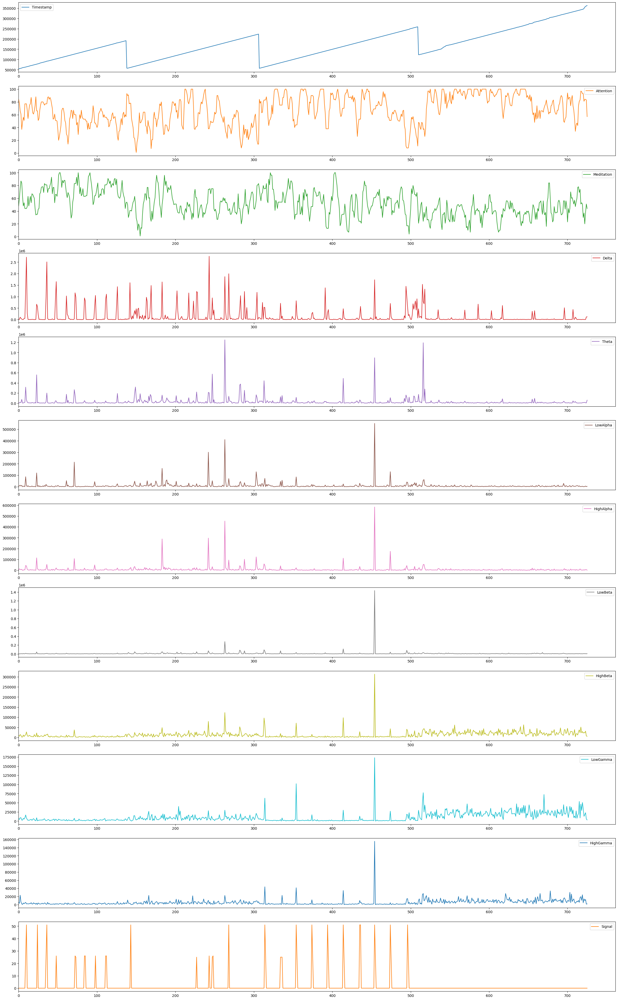

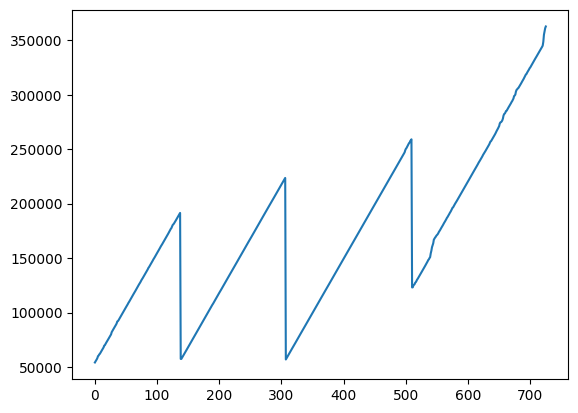

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 726 entries, 0 to 725
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Timestamp   726 non-null    int64 
 1   Attention   726 non-null    int64 
 2   Meditation  726 non-null    int64 
 3   Delta       726 non-null    int64 
 4   Theta       726 non-null    int64 
 5   LowAlpha    726 non-null    int64 
 6   HighAlpha   726 non-null    int64 
 7   LowBeta     726 non-null    int64 
 8   HighBeta    726 non-null    int64 
 9   LowGamma    726 non-null    int64 
 10  HighGamma   726 non-null    int64 
 11  Signal      726 non-null    int64 
 12  Key         513 non-null    object
dtypes: int64(12), object(1)
memory usage: 73.9+ KB


,Timestamp,Attention,Meditation,Delta,Theta,LowAlpha,HighAlpha,LowBeta,HighBeta,LowGamma,HighGamma,Signal
count,726.000000,726.000000,726.000000,7.260000e+02,7.260000e+02,726.000000,726.000000,7.260000e+02,726.00000,726.000000,726.000000,726.000000
mean,170950.804408,67.949036,52.205234,1.260750e+05,2.984623e+04,9602.224518,9188.982094,8.855404e+03,13276.14876,10285.893939,5231.757576,1.929752
std,71973.180058,22.721617,20.061025,3.358937e+05,9.106969e+04,31751.218307,33750.231897,5.488628e+04,17185.51137,13069.916217,7801.497812,8.509420
min,54127.000000,1.000000,1.000000,4.550000e+02,2.410000e+02,65.000000,184.000000,1.300000e+02,111.00000,91.000000,42.000000,0.000000
25%,115850.750000,51.500000,38.000000,4.925000e+03,4.620500e+03,1663.250000,2059.250000,2.148000e+03,3531.50000,1848.500000,1383.250000,0.000000
50%,164463.500000,69.000000,51.000000,1.020850e+04,8.053000e+03,3650.000000,3593.500000,3.541500e+03,8320.50000,5163.500000,3187.000000,0.000000
75%,215592.750000,87.000000,66.000000,3.859450e+04,1.900425e+04,7539.250000,6610.250000,6.724000e+03,18631.25000,15920.500000,7030.750000,0.000000
max,362635.000000,100.000000,100.000000,2.753863e+06,1.250458e+06,550828.000000,582958.000000,1.433520e+06,312986.00000,173018.000000,155568.000000,51.000000


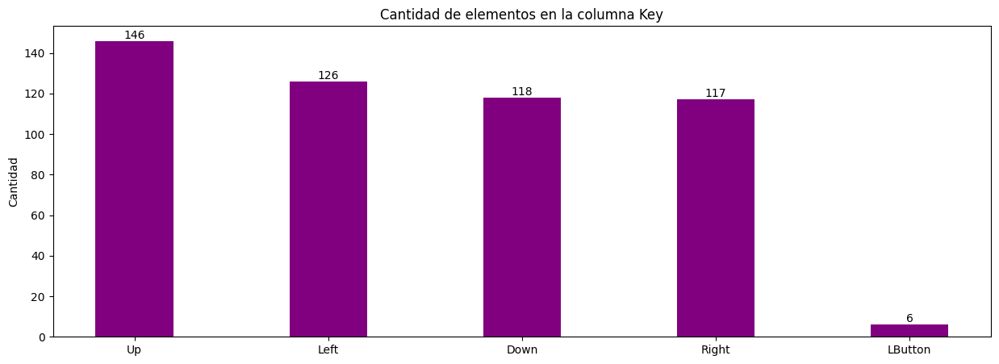

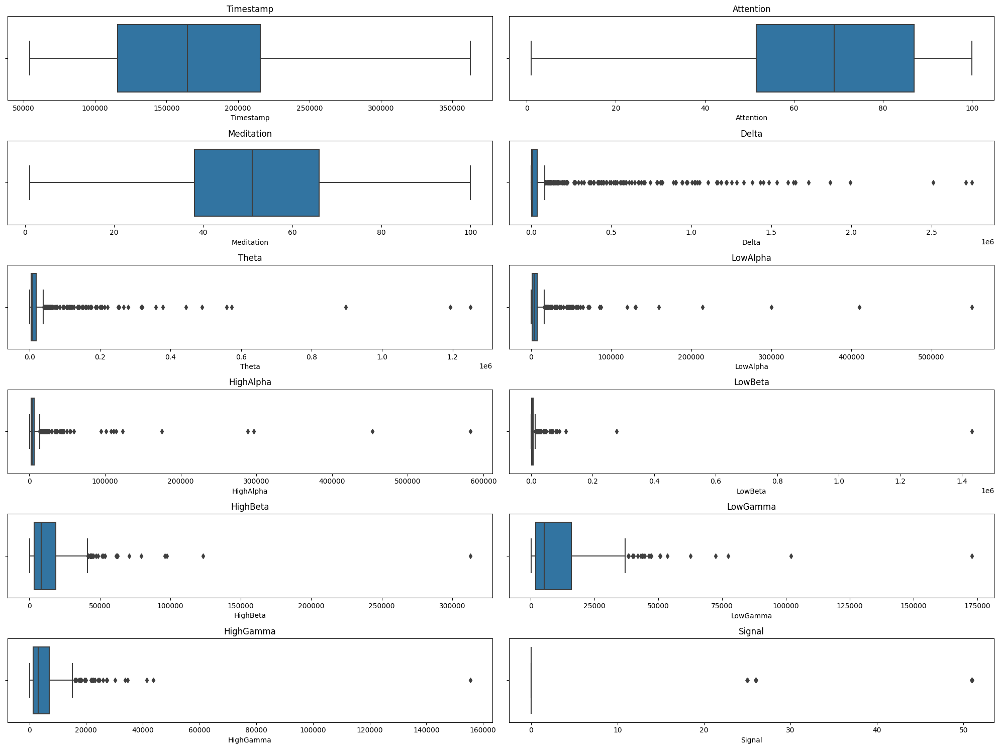

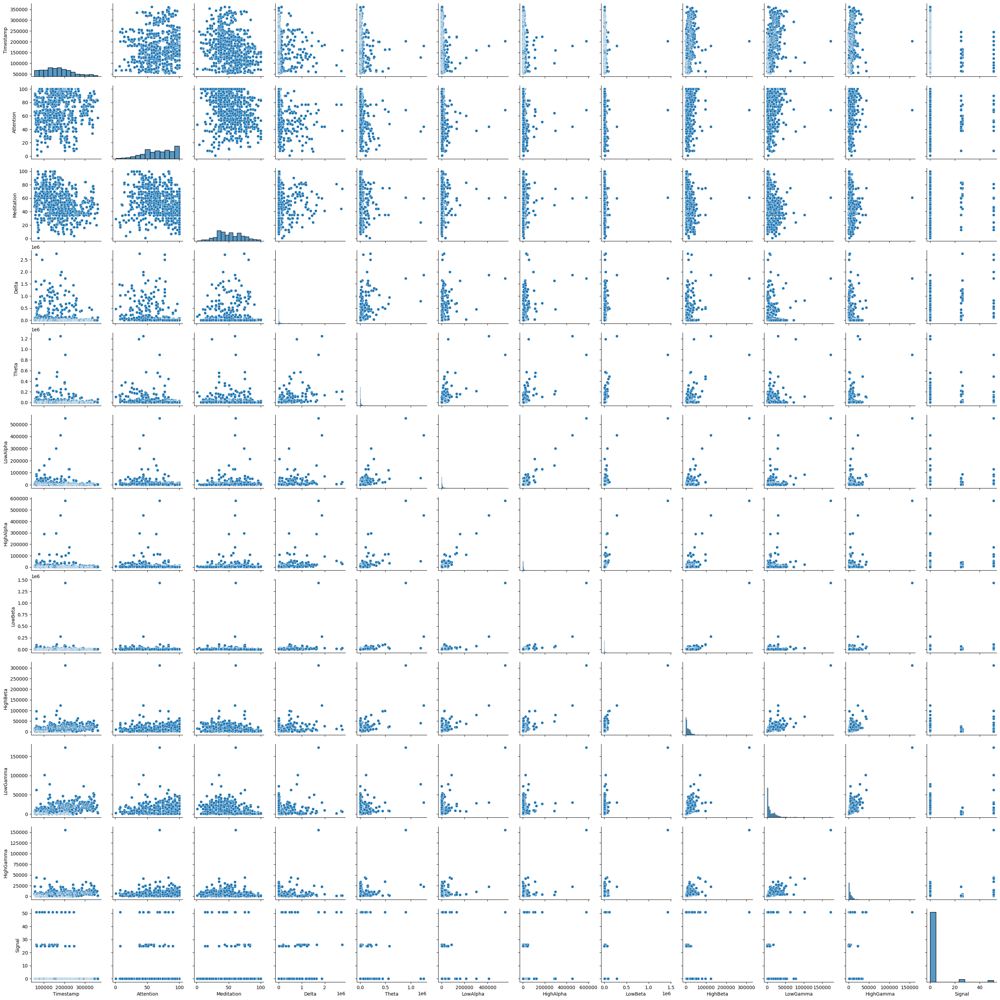

Evaluación de normalidad de los datos originales:


Análisis de la columna: Timestamp


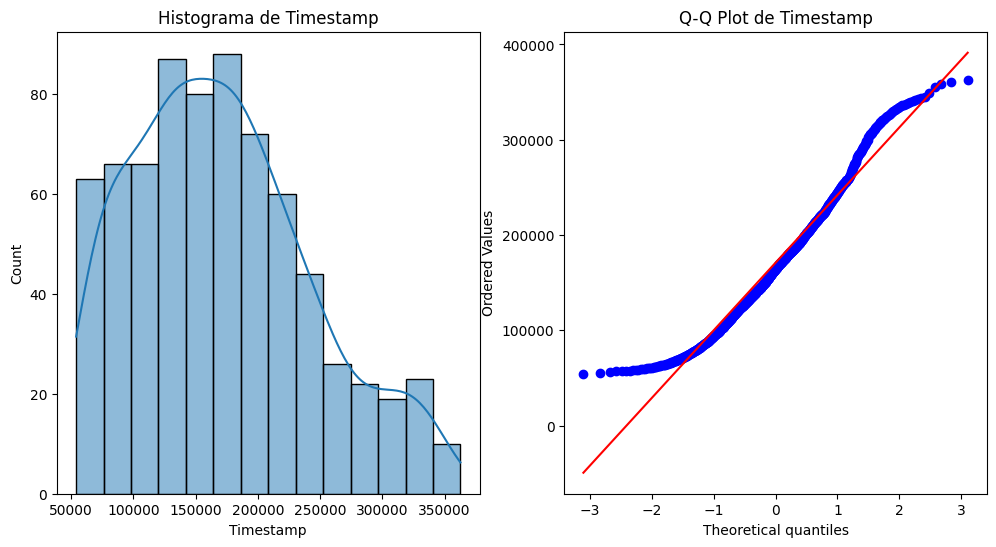

Prueba de Shapiro-Wilk
Estadístico: 0.9658275246620178
p-valor: 5.56074023633224e-12




Análisis de la columna: Attention


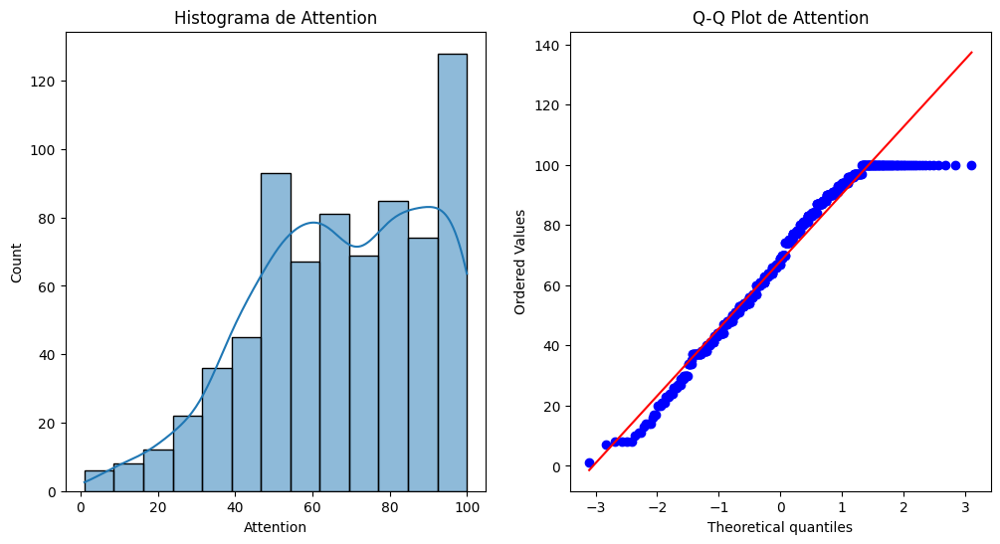

Prueba de Shapiro-Wilk
Estadístico: 0.9594356417655945
p-valor: 2.7940098693869653e-13




Análisis de la columna: Meditation


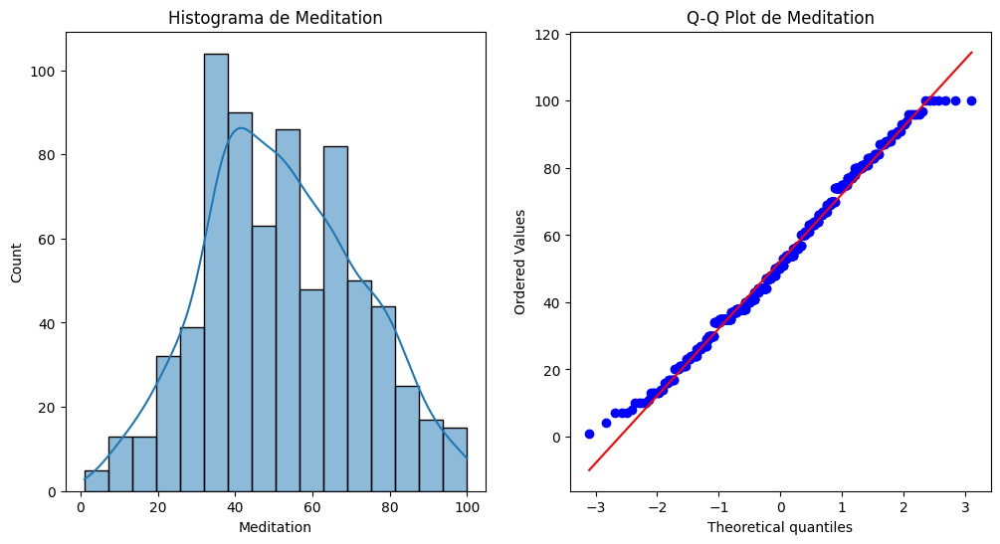

Prueba de Shapiro-Wilk
Estadístico: 0.9907721281051636
p-valor: 0.00016396564024034888




Análisis de la columna: Delta


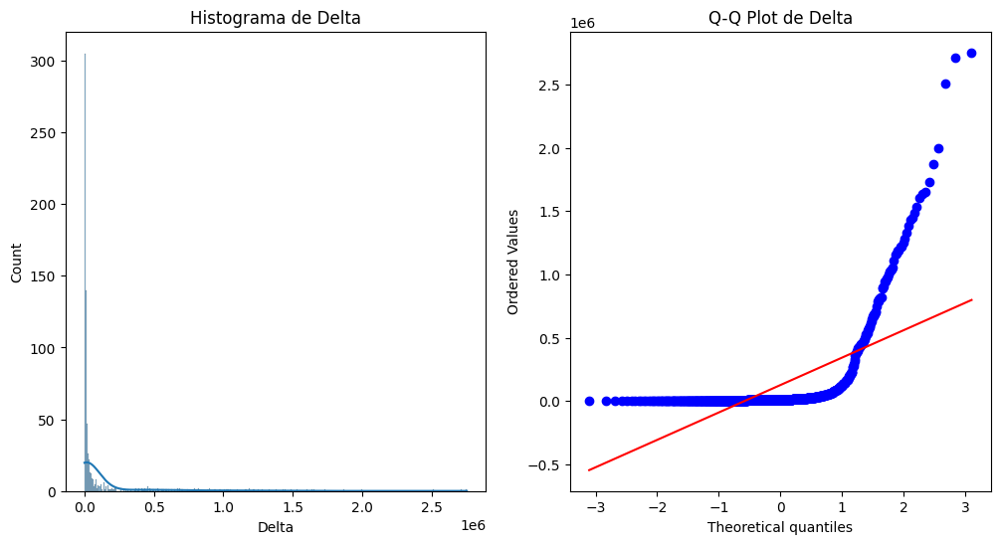

Prueba de Shapiro-Wilk
Estadístico: 0.4154454469680786
p-valor: 3.3911422836660573e-43




Análisis de la columna: Theta


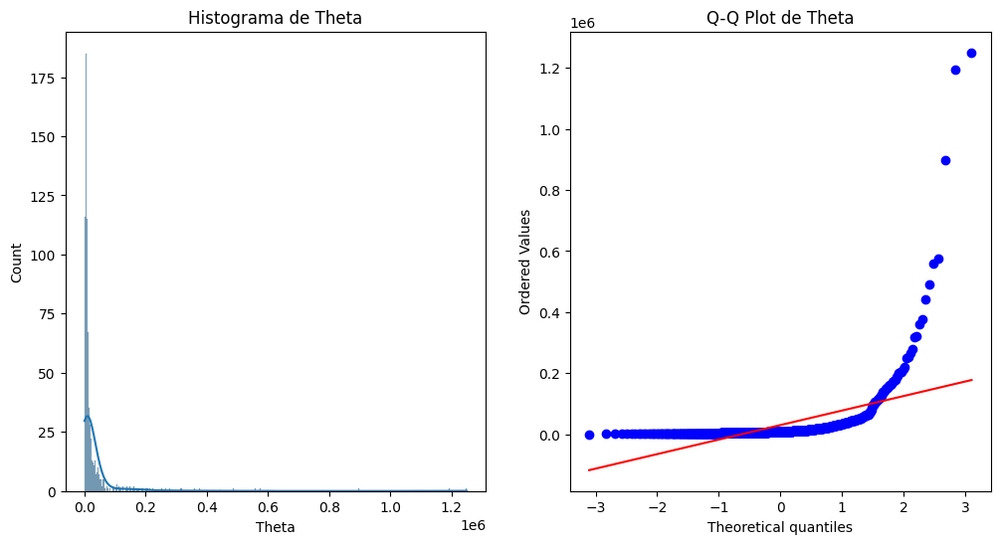

Prueba de Shapiro-Wilk
Estadístico: 0.275526225566864
p-valor: 0.0




Análisis de la columna: LowAlpha


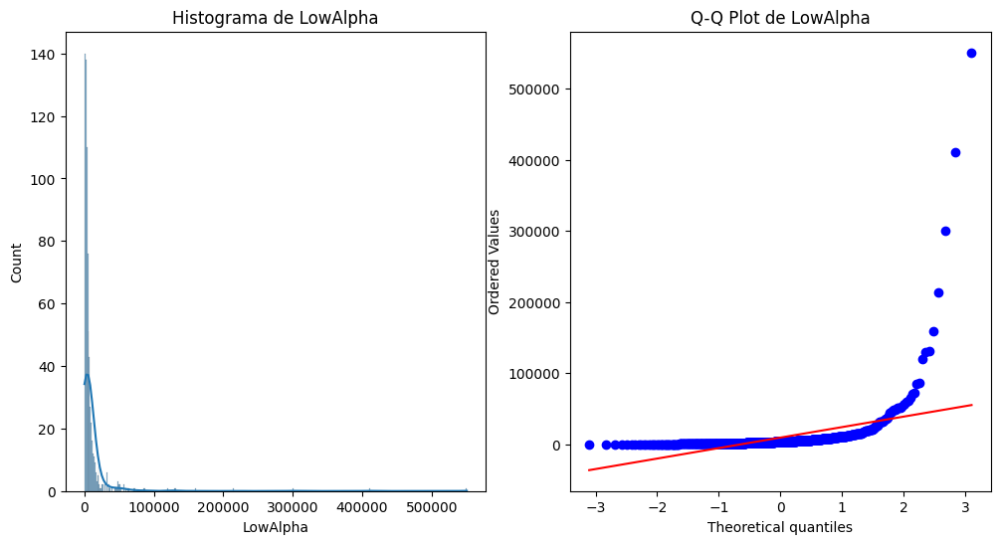

Prueba de Shapiro-Wilk
Estadístico: 0.2193107008934021
p-valor: 0.0




Análisis de la columna: HighAlpha


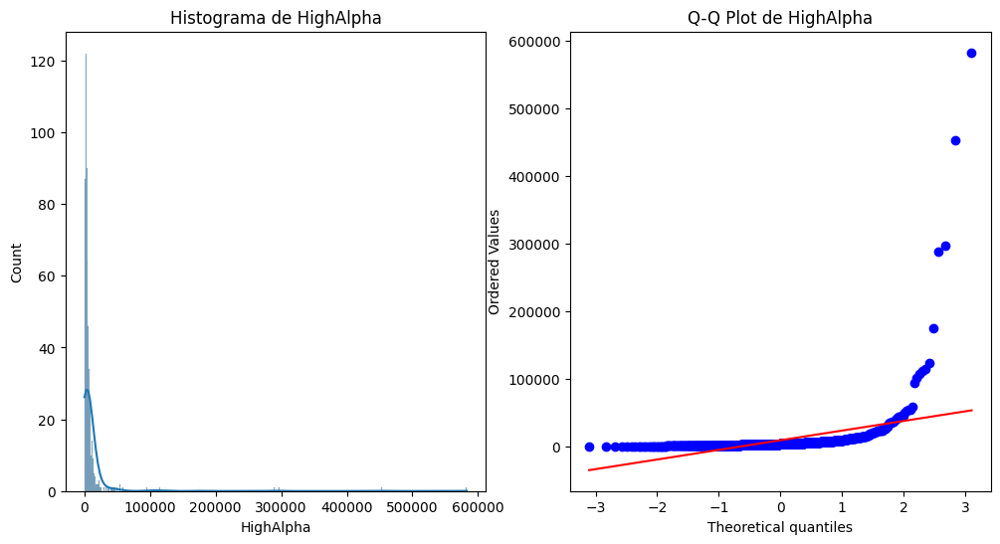

Prueba de Shapiro-Wilk
Estadístico: 0.18210268020629883
p-valor: 0.0




Análisis de la columna: LowBeta


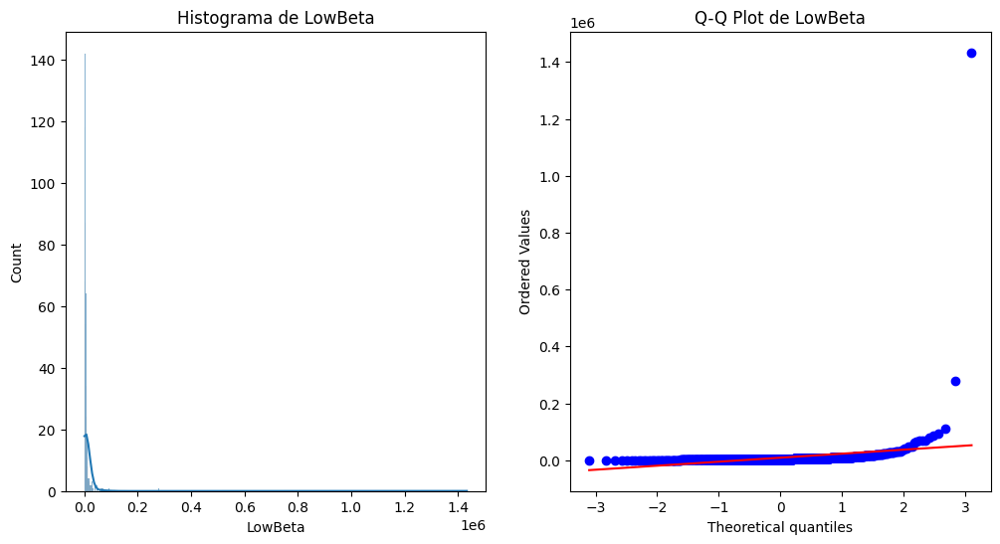

Prueba de Shapiro-Wilk
Estadístico: 0.06999409198760986
p-valor: 0.0




Análisis de la columna: HighBeta


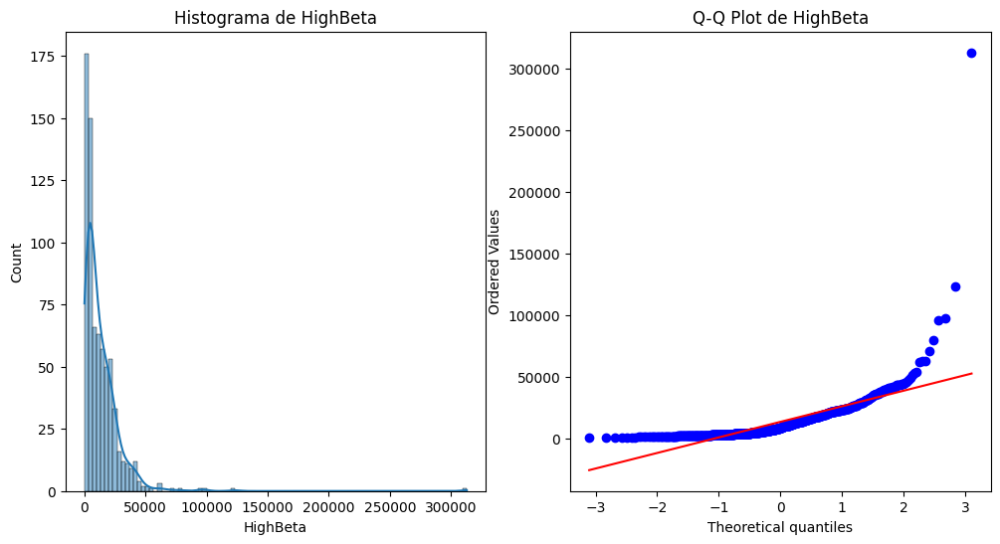

Prueba de Shapiro-Wilk
Estadístico: 0.5434117317199707
p-valor: 1.1739405910850442e-39




Análisis de la columna: LowGamma


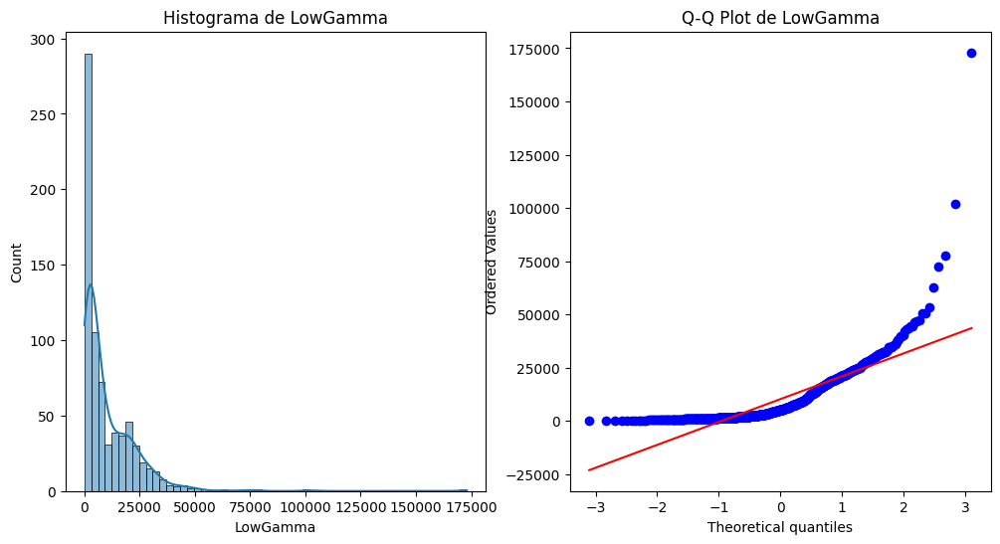

Prueba de Shapiro-Wilk
Estadístico: 0.6755427718162537
p-valor: 5.070454130270517e-35




Análisis de la columna: HighGamma


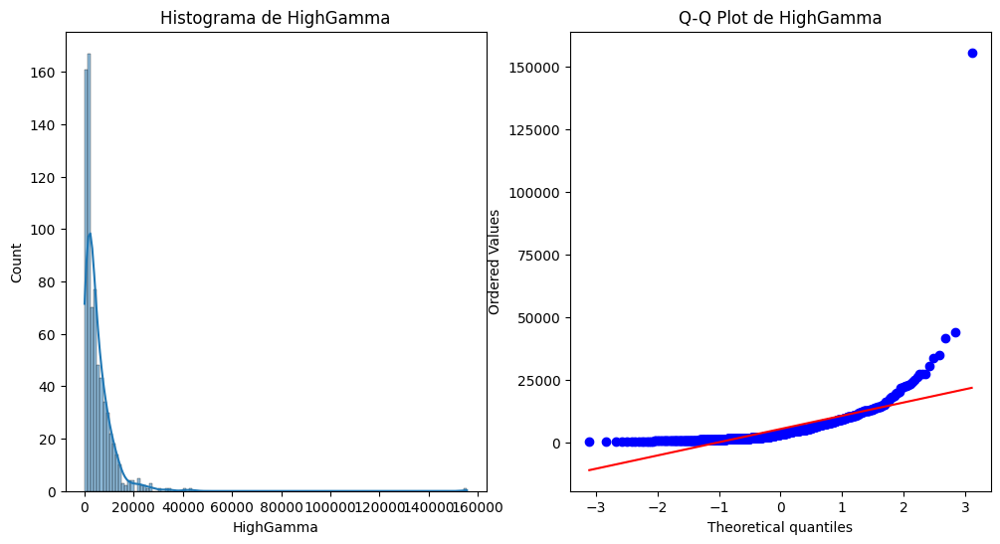

Prueba de Shapiro-Wilk
Estadístico: 0.465118944644928
p-valor: 6.611326154684487e-42




Análisis de la columna: Signal


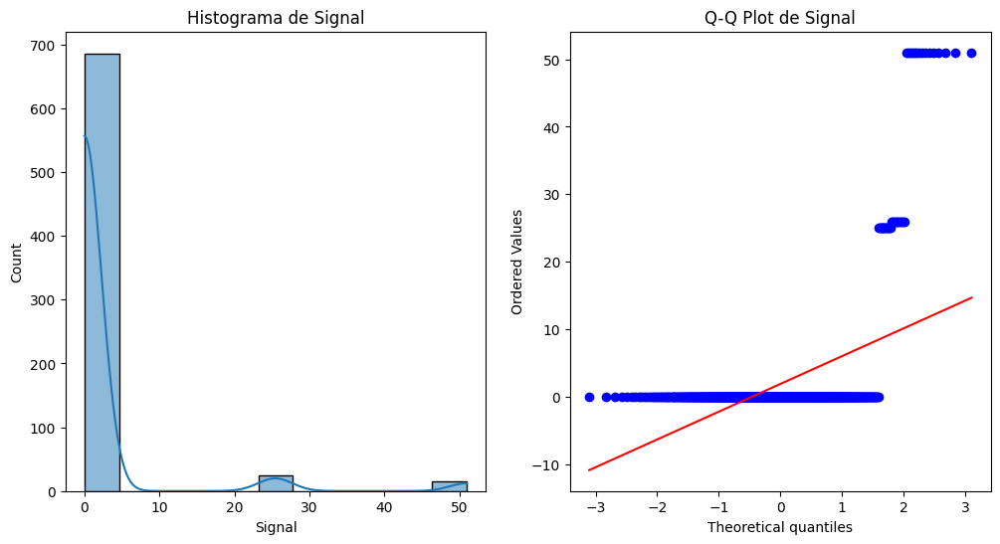

Prueba de Shapiro-Wilk
Estadístico: 0.23332440853118896
p-valor: 0.0


In [34]:
%run 5.CargaDatos.ipynb

## 6. Preprocesado del conjunto de datos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 726 entries, 0 to 725
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Timestamp   726 non-null    int64 
 1   Attention   726 non-null    int64 
 2   Meditation  726 non-null    int64 
 3   Delta       726 non-null    int64 
 4   Theta       726 non-null    int64 
 5   LowAlpha    726 non-null    int64 
 6   HighAlpha   726 non-null    int64 
 7   LowBeta     726 non-null    int64 
 8   HighBeta    726 non-null    int64 
 9   LowGamma    726 non-null    int64 
 10  HighGamma   726 non-null    int64 
 11  Signal      726 non-null    int64 
 12  Key         726 non-null    object
dtypes: int64(12), object(1)
memory usage: 73.9+ KB


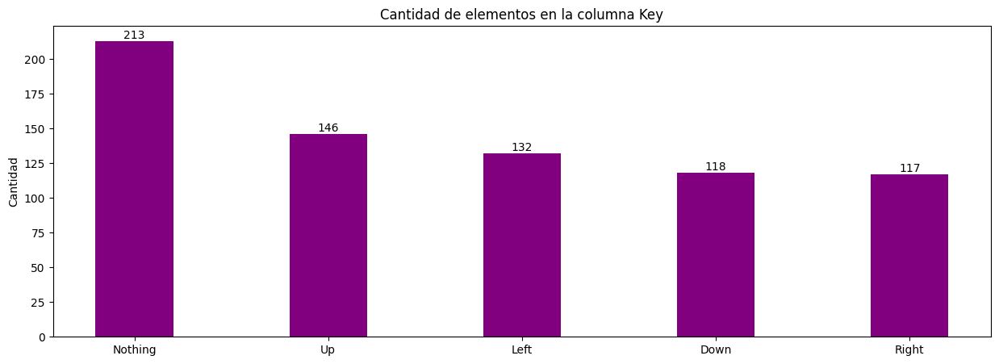

Index(['Timestamp', 'Attention', 'Meditation', 'Delta', 'Theta', 'LowAlpha',
       'HighAlpha', 'LowBeta', 'HighBeta', 'LowGamma', 'HighGamma', 'Key'],
      dtype='object')

'Experimento: 1'

Attention     0
Meditation    0
Delta         3
Theta         3
LowAlpha      3
HighAlpha     3
LowBeta       2
HighBeta      3
LowGamma      1
HighGamma     1
Key           0
dtype: int64

'Total: 8'

'Lista: [2, 9, 10, 23, 36, 48, 71, 126]'

'Experimento: 2'

Attention     0
Meditation    0
Delta         5
Theta         2
LowAlpha      3
HighAlpha     3
LowBeta       2
HighBeta      3
LowGamma      5
HighGamma     3
Key           0
dtype: int64

'Total: 12'

'Lista: [142, 166, 183, 204, 206, 222, 242, 243, 247, 263, 268, 282]'

'Experimento: 3'

Attention     0
Meditation    0
Delta         5
Theta         3
LowAlpha      1
HighAlpha     2
LowBeta       1
HighBeta      3
LowGamma      3
HighGamma     3
Key           0
dtype: int64

'Total: 10'

'Lista: [313, 314, 354, 391, 414, 454, 474, 494, 495, 508]'

'Experimento: 4'

Attention     1
Meditation    2
Delta         6
Theta         2
LowAlpha      3
HighAlpha     2
LowBeta       4
HighBeta      2
LowGamma      2
HighGamma     6
Key           0
dtype: int64

'Total: 18'

'Lista: [515, 516, 517, 518, 556, 586, 617, 621, 644, 665, 668, 670, 676, 677, 678, 695, 703, 705]'

'Antes: 726'

'Despues: 678'

,Attention,Meditation,Delta,Theta,LowAlpha,HighAlpha,LowBeta,HighBeta,LowGamma,HighGamma,Key
0,84,48,25253,14225,3441,4172,1881,9630,6863,5745,4
1,78,60,4946,5021,8879,13002,879,6367,4314,3150,0
2,61,87,57763,12541,6173,5120,3238,10192,9048,6663,0
3,37,84,21560,74162,11297,9217,4844,1945,2644,1678,0
4,48,63,2540,1384,692,467,1313,2271,2560,445,0
...,...,...,...,...,...,...,...,...,...,...,...
673,81,37,4088,13782,756,5536,7114,24230,12942,14061,2
674,84,20,3490,13947,2299,2051,3315,22789,17542,9966,2
675,84,38,3619,8525,5623,6665,5345,31352,22837,12553,2
676,83,51,116972,5464,1405,6395,2285,7186,5351,1219,2


,Attention,Meditation,Delta,Theta,LowAlpha,HighAlpha,LowBeta,HighBeta,LowGamma,HighGamma,Key
0,1.737682,-1.475134,-0.292529,0.113404,-0.128579,-0.130215,-0.488718,1.422434,2.384682,2.969090,4.0
1,1.349318,-0.698485,-0.366728,-0.291373,0.705022,1.516928,-0.956520,0.417438,0.861329,0.877518,0.0
2,0.248952,1.048973,-0.173741,0.039344,0.290215,0.046625,0.144823,1.595529,3.690499,3.708998,0.0
3,-1.304507,0.854811,-0.306022,2.749333,1.075682,0.810876,0.894613,-0.944526,-0.136710,-0.308915,0.0
4,-0.592505,-0.504323,-0.375519,-0.451322,-0.549978,-0.821343,-0.753899,-0.844119,-0.186910,-1.302714,0.0
...,...,...,...,...,...,...,...,...,...,...,...
673,-0.122780,-0.172045,-0.318588,0.121299,-0.996218,0.282769,0.391385,0.227211,-0.857851,1.227984,2.0
674,0.063269,-1.409443,-0.325661,0.131069,-0.561353,-0.633364,-0.585153,0.087701,-0.366831,0.293033,2.0
675,0.063269,-0.099257,-0.324135,-0.189999,0.375455,0.579559,-0.063339,0.916722,0.198376,0.883685,2.0
676,0.001253,0.846989,1.016479,-0.371260,-0.813310,0.508582,-0.849916,-1.422891,-1.668141,-1.704040,2.0


,Attention,Meditation,Delta,Theta,LowAlpha,HighAlpha,LowBeta,HighBeta,LowGamma,HighGamma,Key
0,0.685458,-0.211643,-0.258454,-0.122479,-0.282657,-0.155326,-0.510750,-0.181465,-0.224642,0.306470,4.0
1,0.419765,0.382946,-0.354973,-0.384973,0.276687,0.919317,-0.658054,-0.499377,-0.484373,-0.311967,0.0
2,-0.333030,1.720772,-0.103935,-0.170506,-0.001648,-0.039951,-0.311257,-0.126709,-0.002001,0.525247,0.0
3,-1.395800,1.572125,-0.276007,1.586893,0.525398,0.458669,-0.075158,-0.930211,-0.654538,-0.662772,0.0
4,-0.908697,0.531593,-0.366409,-0.488698,-0.565414,-0.606238,-0.594252,-0.898449,-0.663097,-0.956619,0.0
...,...,...,...,...,...,...,...,...,...,...,...
673,0.552612,-0.756684,-0.359051,-0.135113,-0.558831,0.010677,0.258556,1.241007,0.394780,2.288329,2.0
674,0.685458,-1.599019,-0.361893,-0.130408,-0.400121,-0.413460,-0.299937,1.100611,0.863498,1.312414,2.0
675,0.685458,-0.707135,-0.361280,-0.285040,-0.058220,0.148081,-0.001506,1.934900,1.403034,1.928944,2.0
676,0.641176,-0.062996,0.177484,-0.372338,-0.492076,0.115221,-0.451358,-0.419583,-0.378708,-0.772160,2.0


Evaluación de normalidad de los datos originales:




Análisis de la columna: Attention


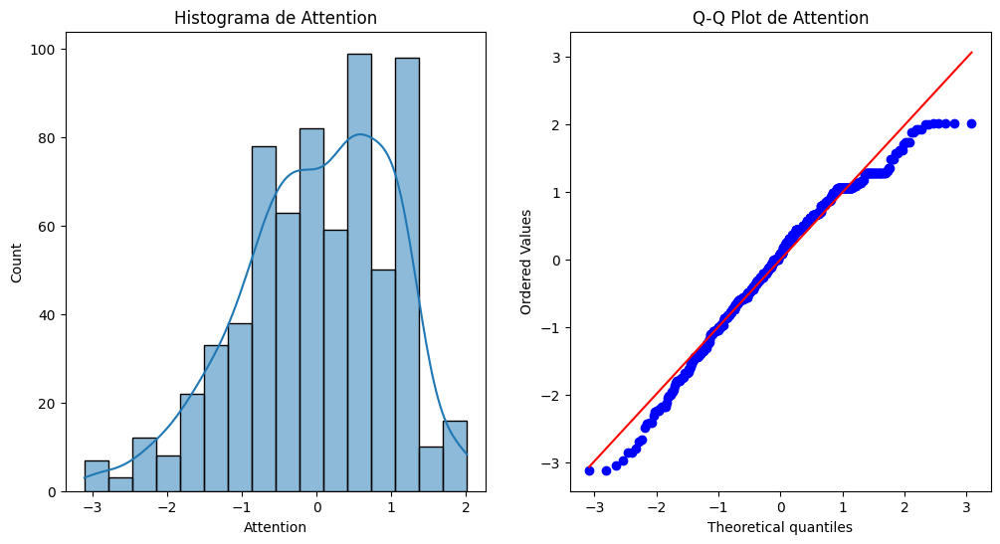

Prueba de Shapiro-Wilk
Estadístico: 0.9766631126403809
p-valor: 6.318545686667676e-09




Análisis de la columna: Meditation


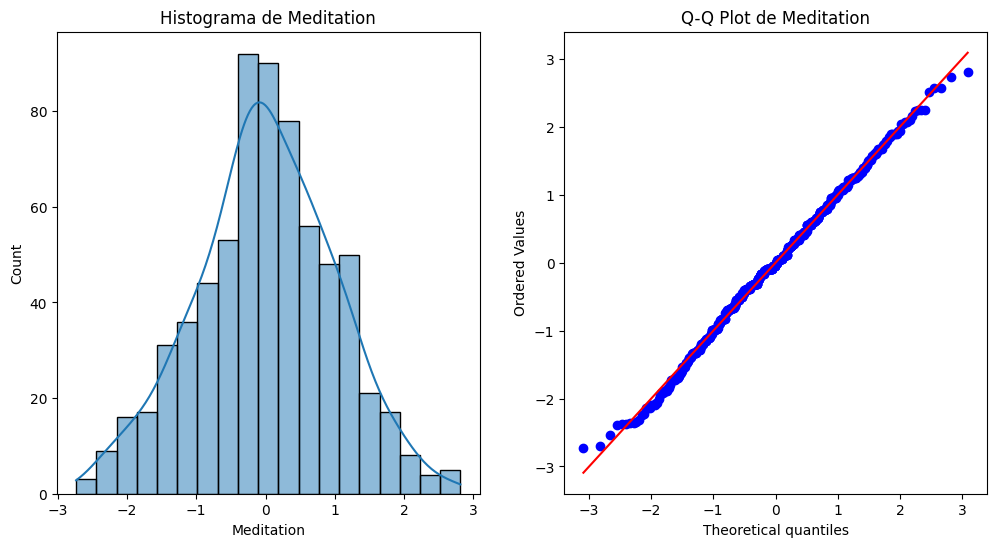

Prueba de Shapiro-Wilk
Estadístico: 0.9970932006835938
p-valor: 0.268931120634079




Análisis de la columna: Delta


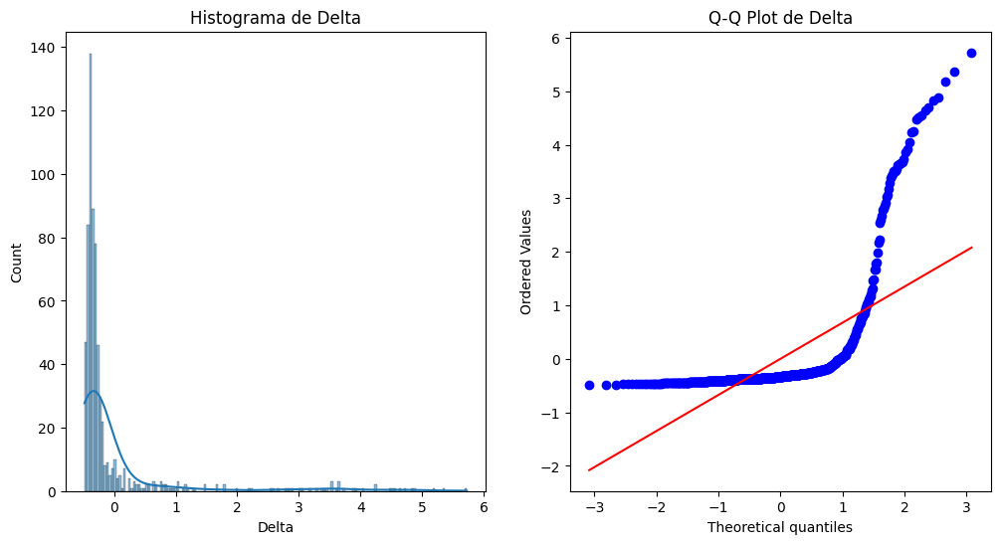

Prueba de Shapiro-Wilk
Estadístico: 0.4522409439086914
p-valor: 3.984452053461185e-41




Análisis de la columna: Theta


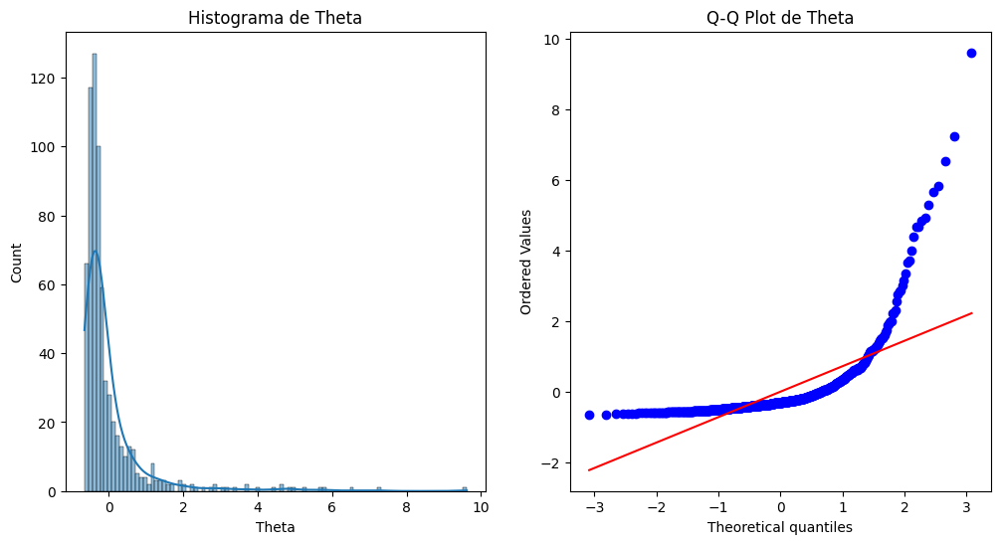

Prueba de Shapiro-Wilk
Estadístico: 0.5198158025741577
p-valor: 2.833929962311937e-39




Análisis de la columna: LowAlpha


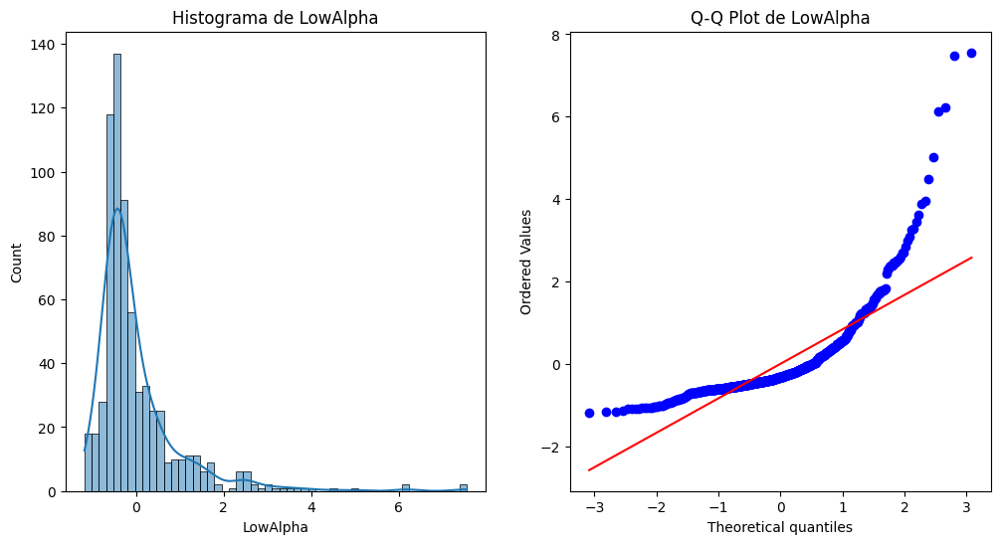

Prueba de Shapiro-Wilk
Estadístico: 0.6965807676315308
p-valor: 3.6479369655037444e-33




Análisis de la columna: HighAlpha


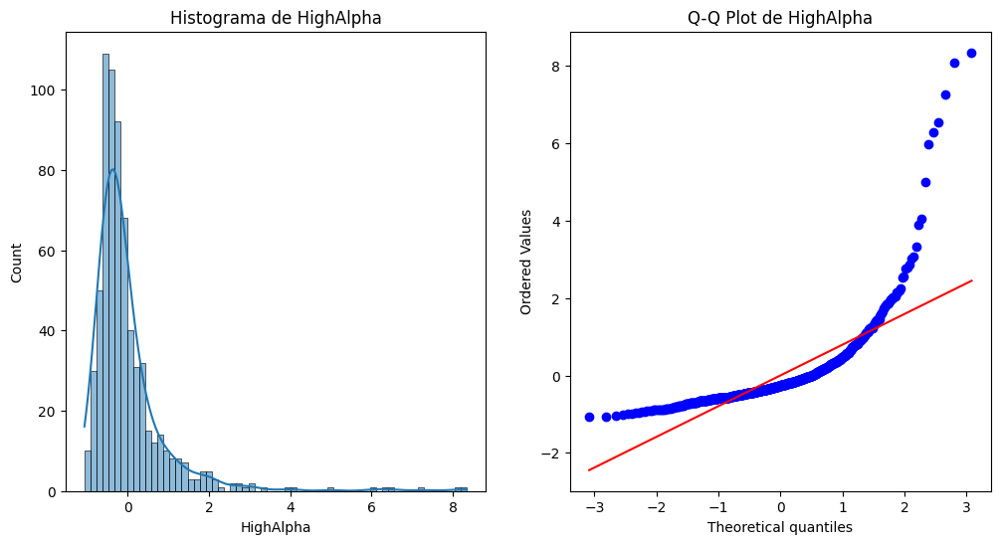

Prueba de Shapiro-Wilk
Estadístico: 0.6277952194213867
p-valor: 8.114517716292426e-36




Análisis de la columna: LowBeta


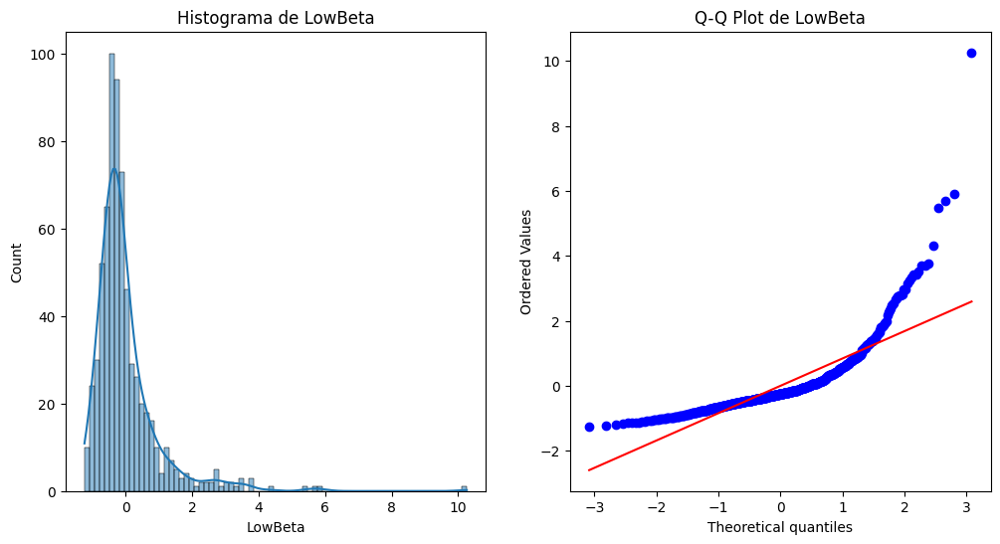

Prueba de Shapiro-Wilk
Estadístico: 0.7067742347717285
p-valor: 9.8917048816169e-33




Análisis de la columna: HighBeta


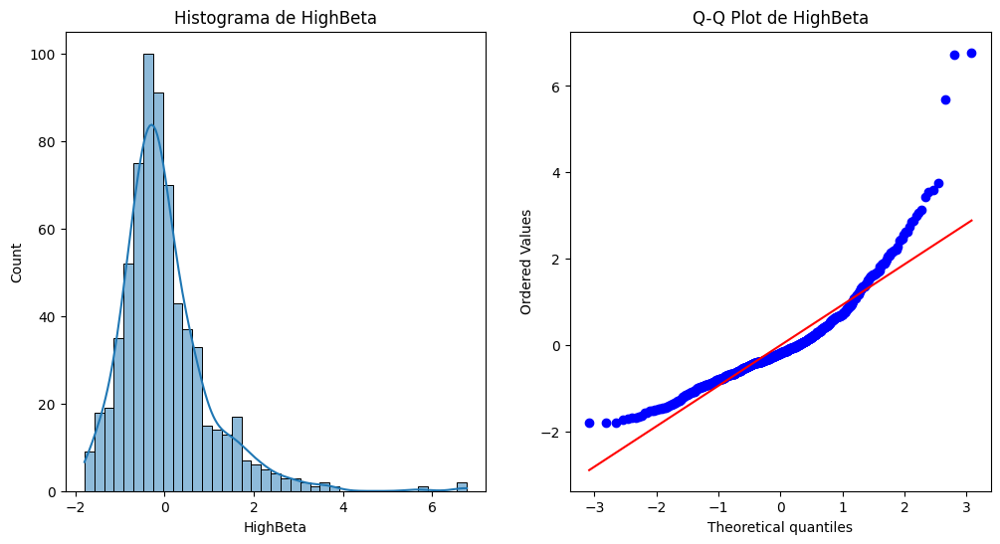

Prueba de Shapiro-Wilk
Estadístico: 0.872129499912262
p-valor: 3.9756658491643014e-23




Análisis de la columna: LowGamma


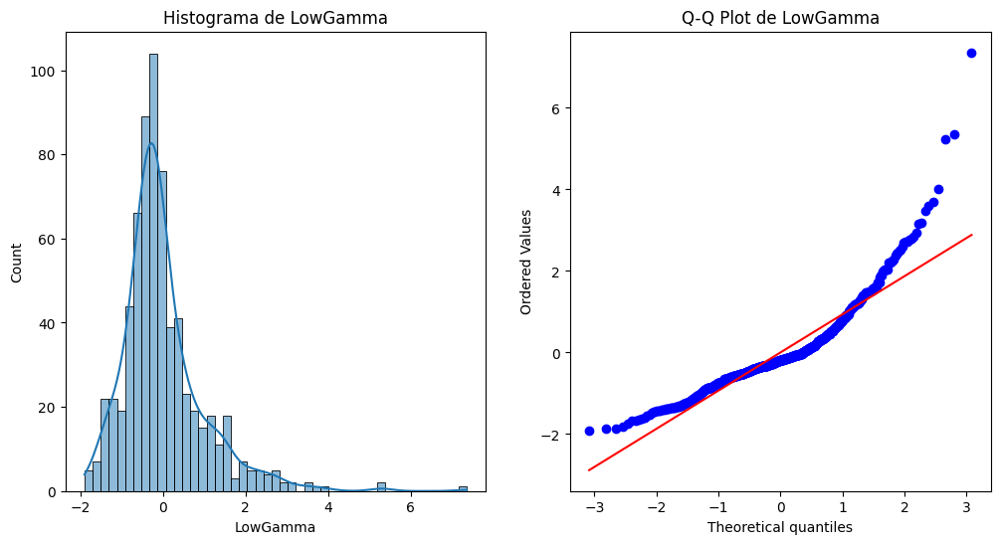

Prueba de Shapiro-Wilk
Estadístico: 0.8705999851226807
p-valor: 2.9801943842568544e-23




Análisis de la columna: HighGamma


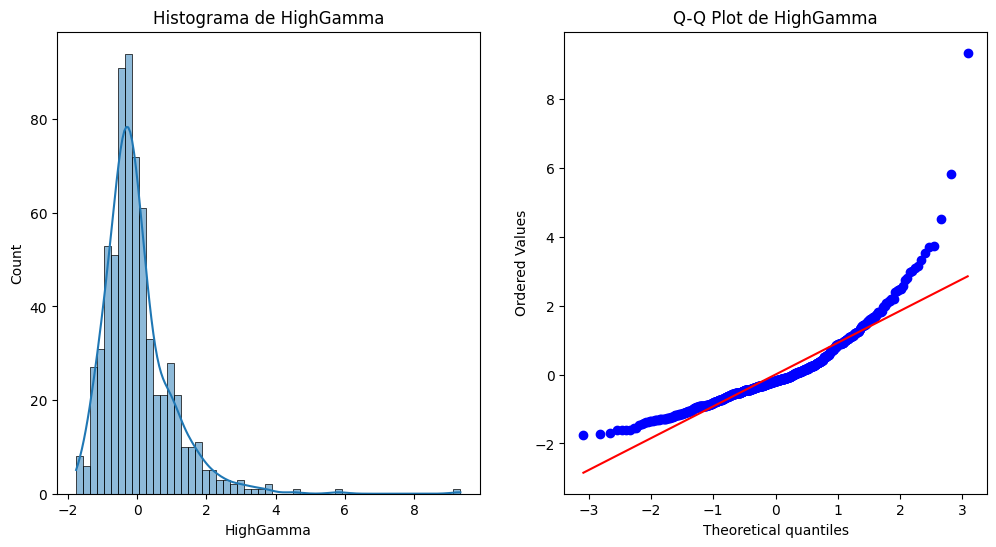

Prueba de Shapiro-Wilk
Estadístico: 0.8506144285202026
p-valor: 8.58639991022789e-25




Análisis de la columna: Key


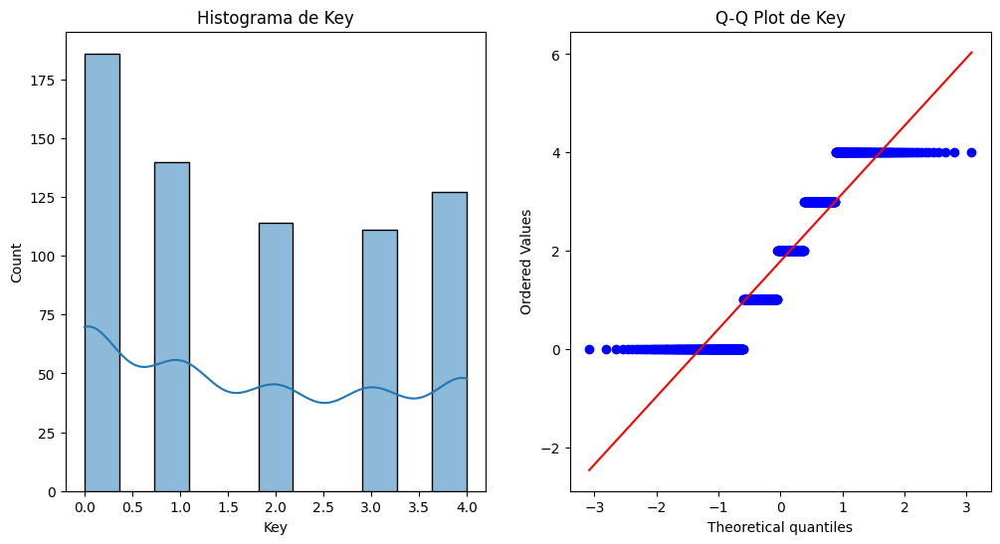

Prueba de Shapiro-Wilk
Estadístico: 0.8668276071548462
p-valor: 1.479952914203828e-23




Análisis de la columna: Attention


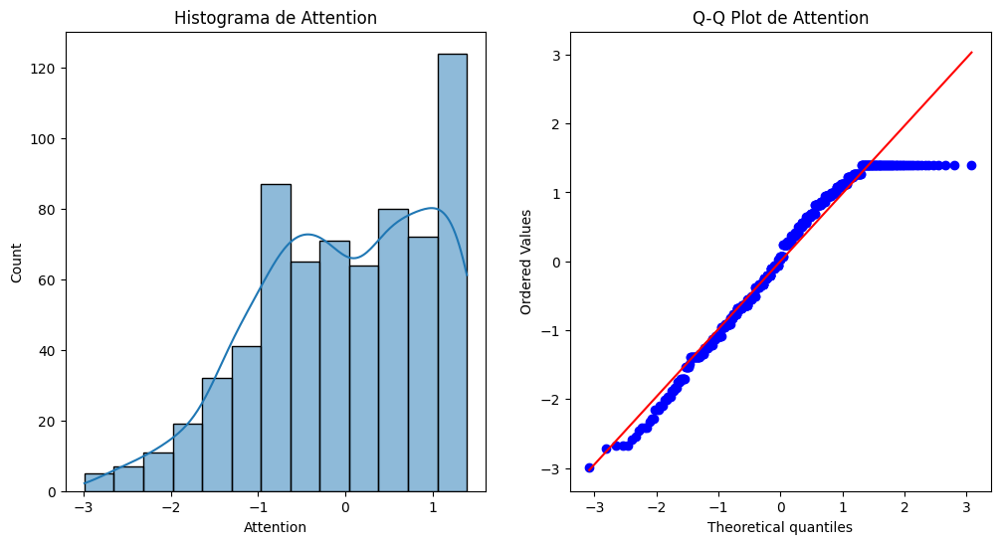

Prueba de Shapiro-Wilk
Estadístico: 0.9573078751564026
p-valor: 3.963882987036843e-13




Análisis de la columna: Meditation


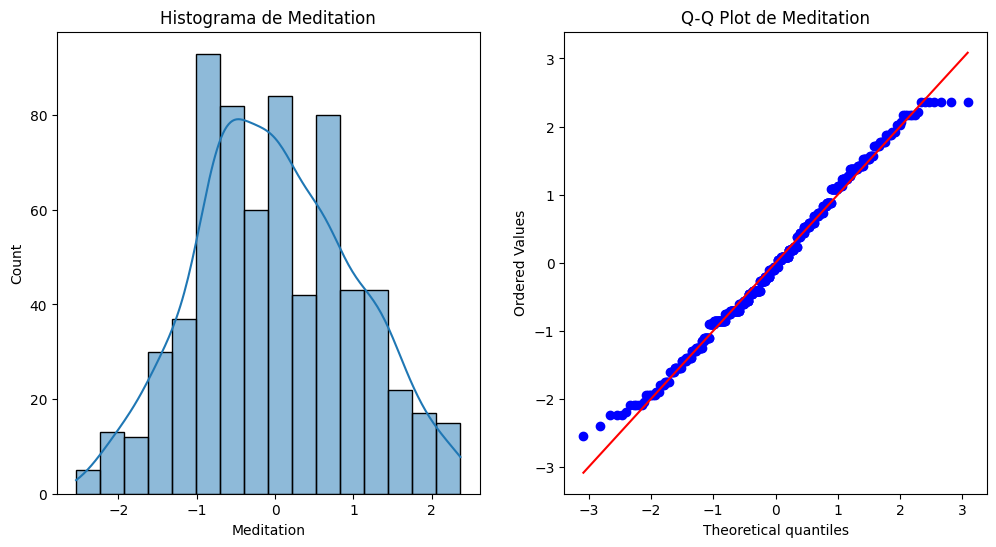

Prueba de Shapiro-Wilk
Estadístico: 0.991364061832428
p-valor: 0.0005397641798481345




Análisis de la columna: Delta


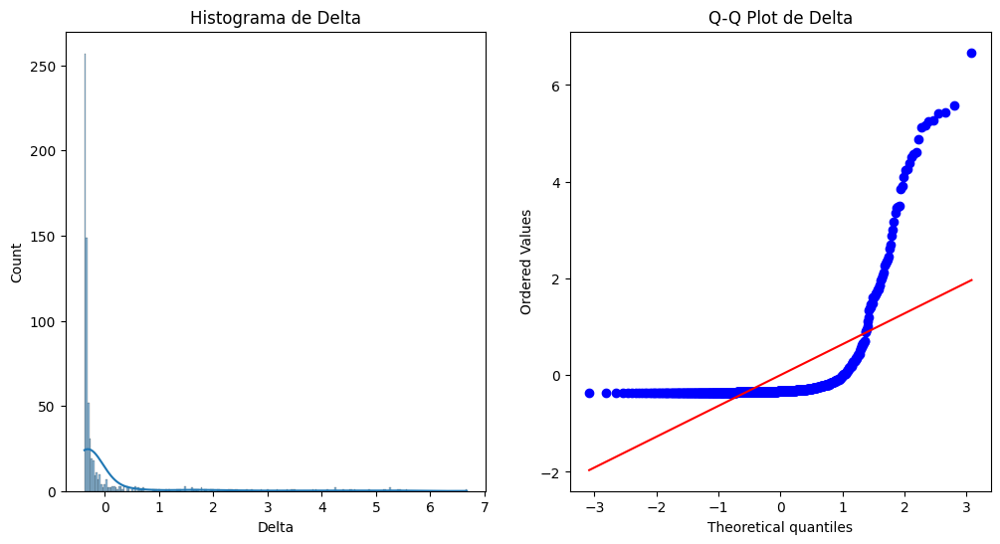

Prueba de Shapiro-Wilk
Estadístico: 0.4047408103942871
p-valor: 2.557369697392791e-42




Análisis de la columna: Theta


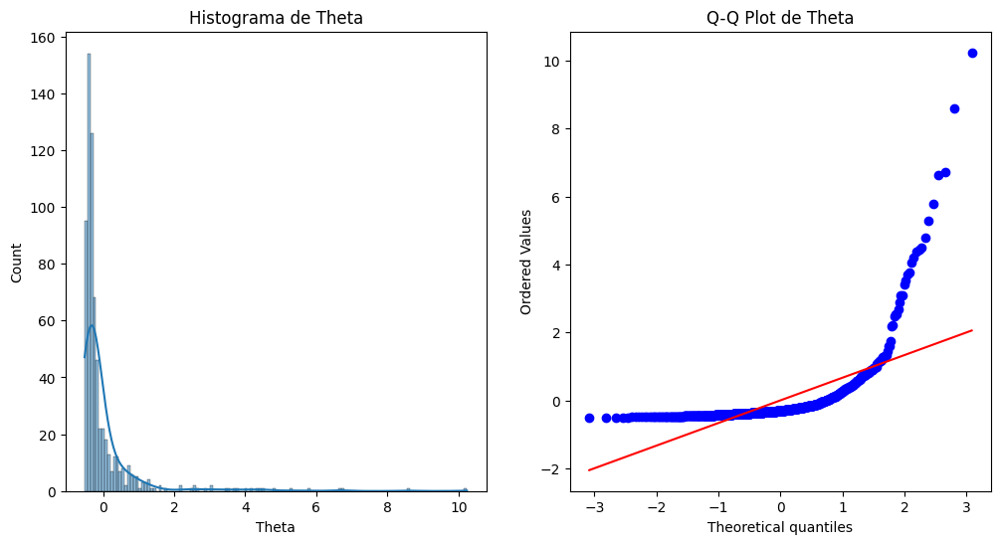

Prueba de Shapiro-Wilk
Estadístico: 0.4441784620285034
p-valor: 2.466565556904543e-41




Análisis de la columna: LowAlpha


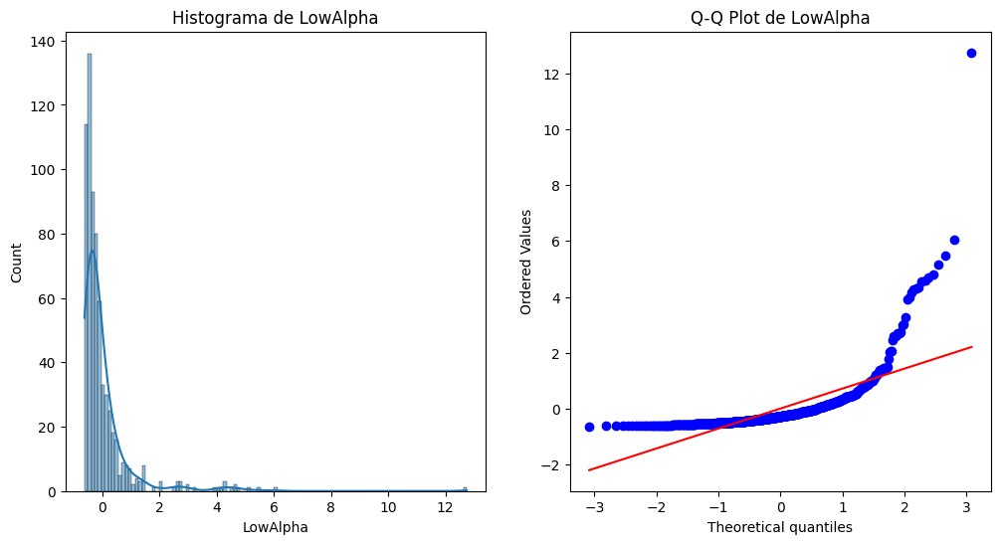

Prueba de Shapiro-Wilk
Estadístico: 0.5122922658920288
p-valor: 1.7219730061993725e-39




Análisis de la columna: HighAlpha


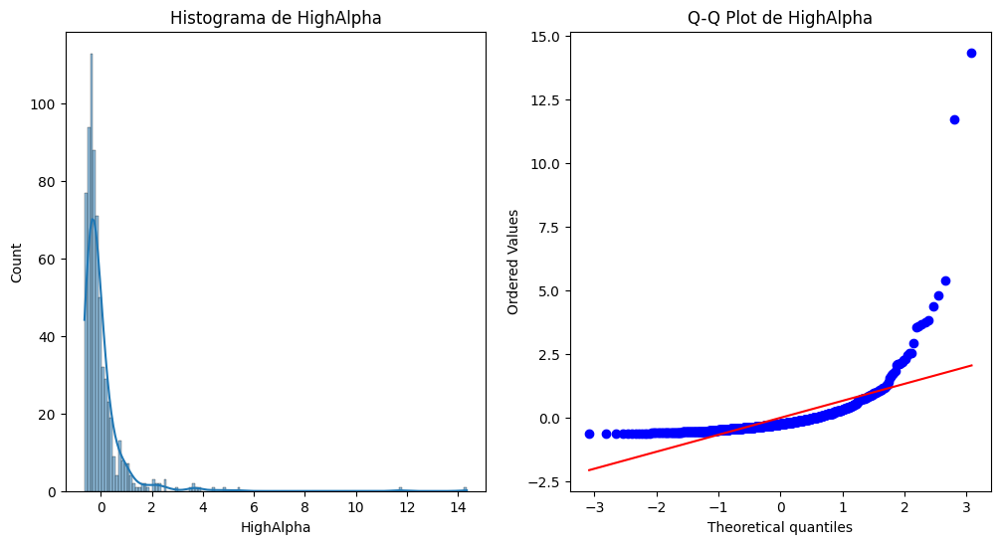

Prueba de Shapiro-Wilk
Estadístico: 0.4471168518066406
p-valor: 2.935720282760492e-41




Análisis de la columna: LowBeta


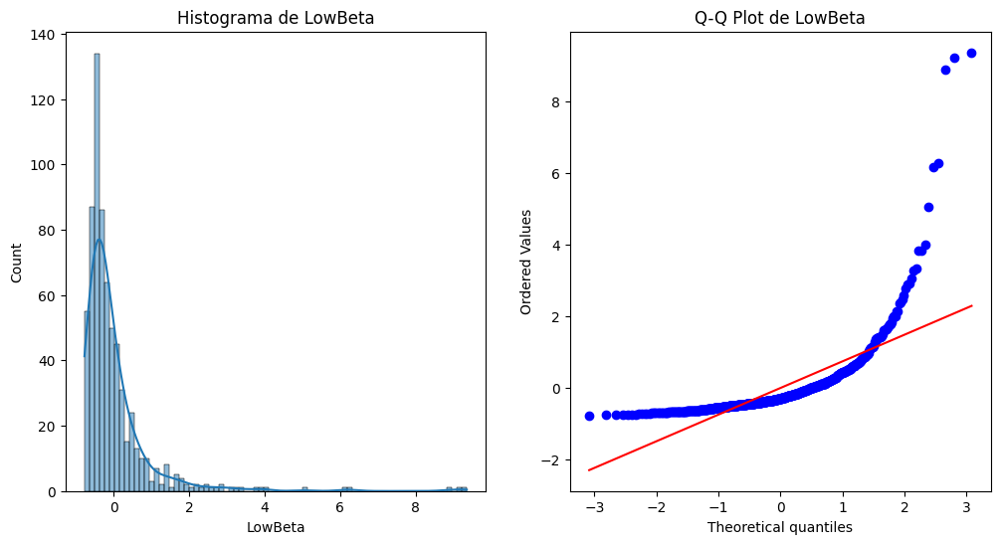

Prueba de Shapiro-Wilk
Estadístico: 0.5511011481285095
p-valor: 2.414736010864254e-38




Análisis de la columna: HighBeta


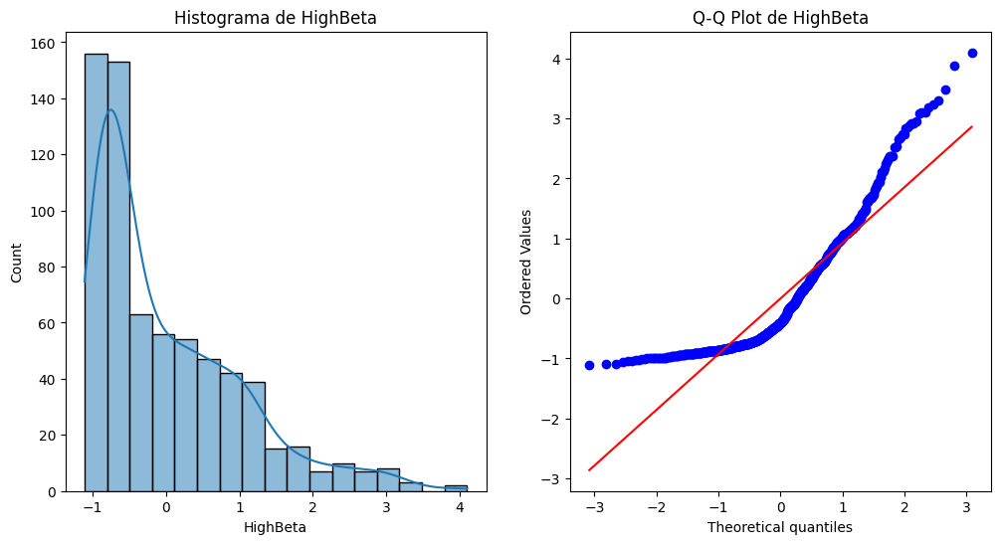

Prueba de Shapiro-Wilk
Estadístico: 0.8533689379692078
p-valor: 1.3689842845398863e-24




Análisis de la columna: LowGamma


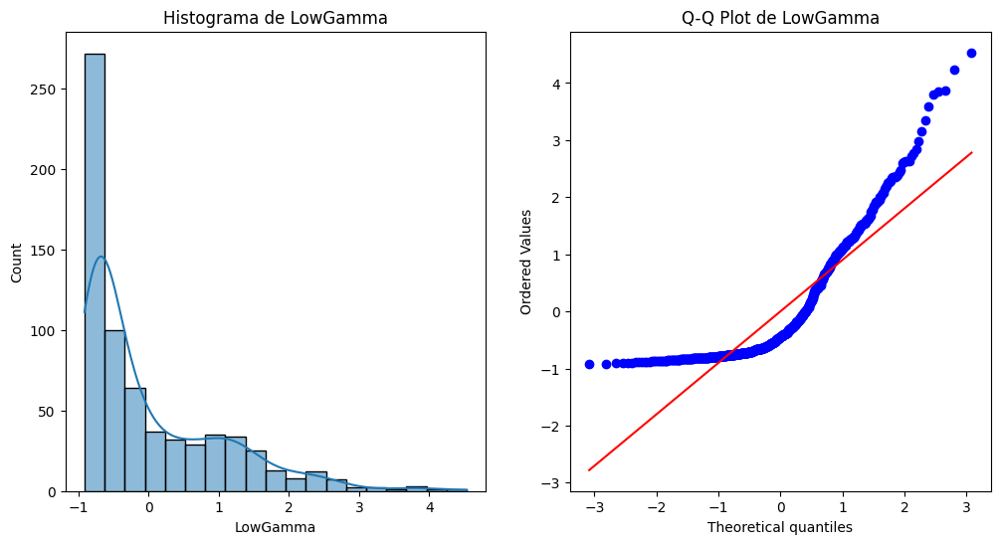

Prueba de Shapiro-Wilk
Estadístico: 0.8061374425888062
p-valor: 1.0091479055915489e-27




Análisis de la columna: HighGamma


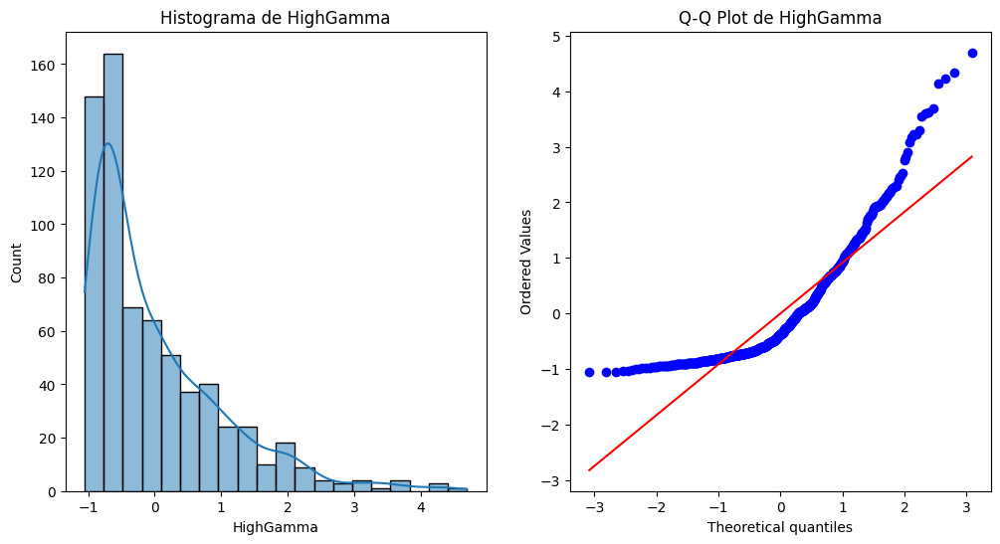

Prueba de Shapiro-Wilk
Estadístico: 0.8301301598548889
p-valor: 3.242645722831617e-26




Análisis de la columna: Key


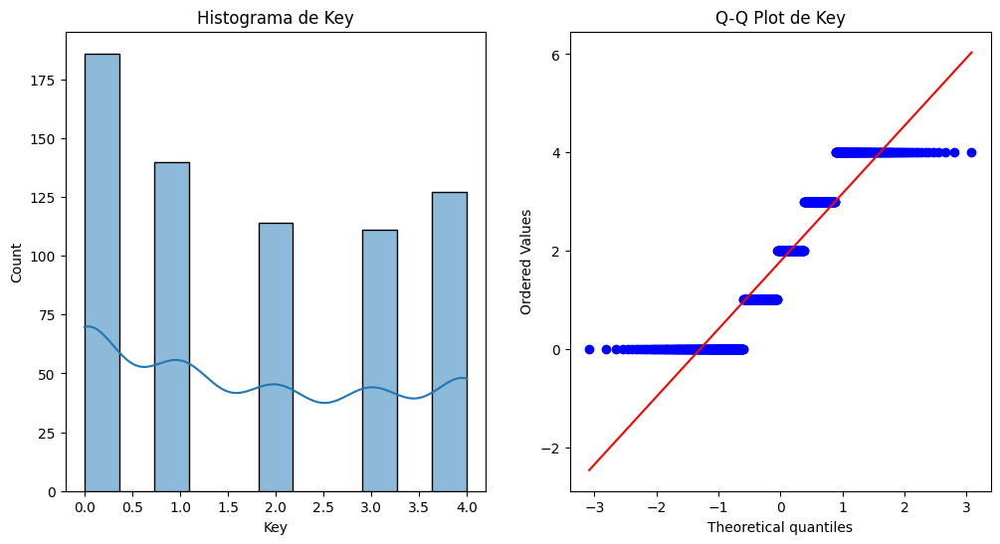

Prueba de Shapiro-Wilk
Estadístico: 0.8668276071548462
p-valor: 1.479952914203828e-23


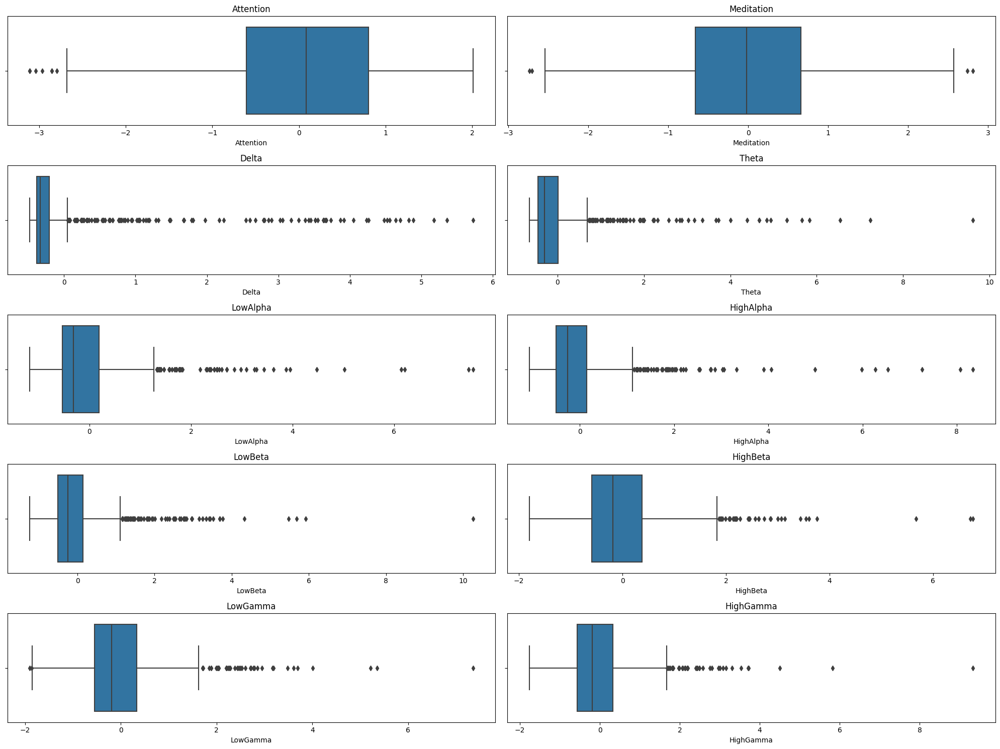

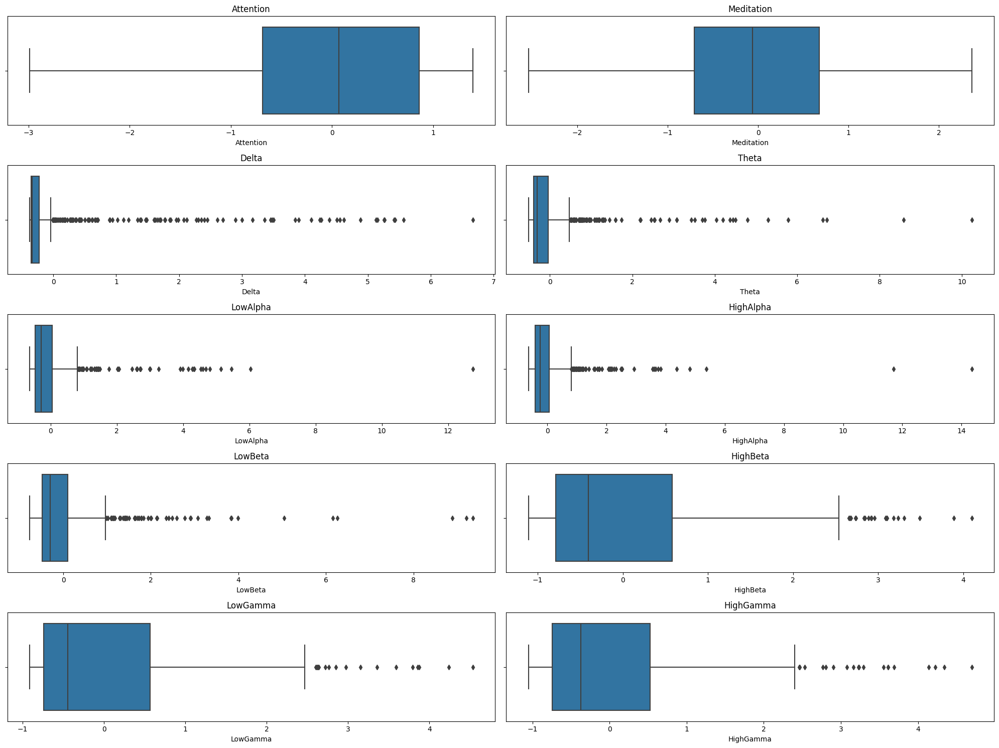

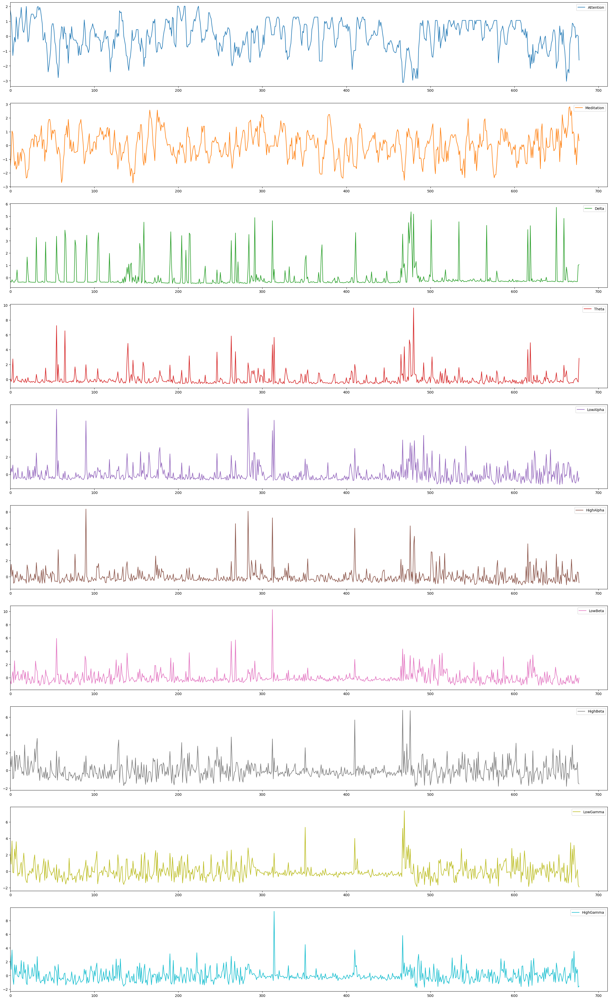

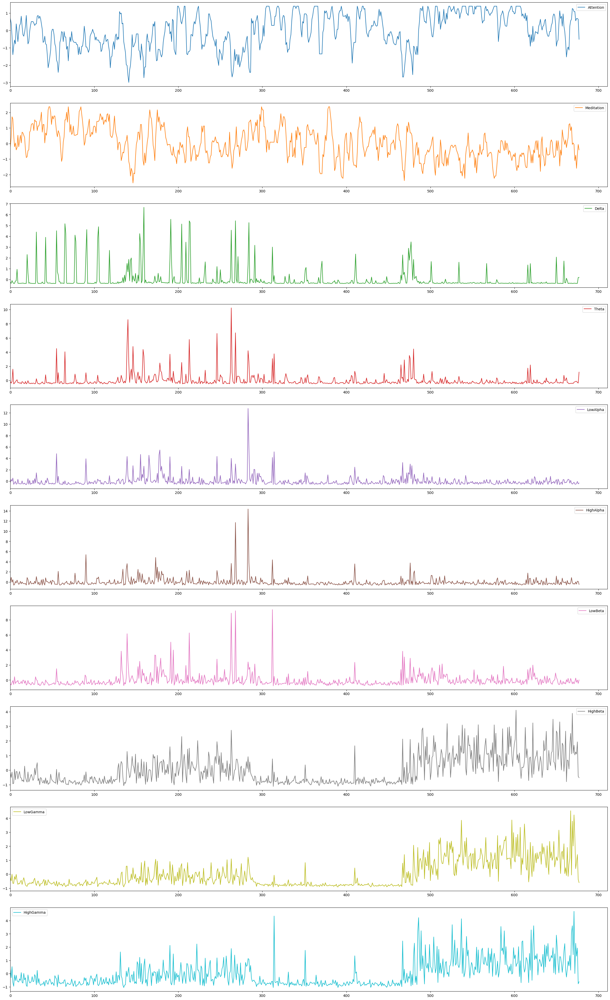

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 678 entries, 0 to 677
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Attention   678 non-null    float64
 1   Meditation  678 non-null    float64
 2   Delta       678 non-null    float64
 3   Theta       678 non-null    float64
 4   LowAlpha    678 non-null    float64
 5   HighAlpha   678 non-null    float64
 6   LowBeta     678 non-null    float64
 7   HighBeta    678 non-null    float64
 8   LowGamma    678 non-null    float64
 9   HighGamma   678 non-null    float64
 10  Key         678 non-null    float64
dtypes: float64(11)
memory usage: 58.4 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Attention   130 non-null    float64
 1   Meditation  130 non-null    float64
 2   Delta       130 non-null    float64
 3   Theta

In [35]:
%run 6.Preprocessing.ipynb

# Notebooks para experimentos de varios modelos de aprendizaje automático:

## 7. Implementación modelos Machine Learning

,KNN_VAL
Segmento 1,0.416667
Segmento 2,0.400000
Segmento 3,0.277778
Segmento 4,0.222222
All Segmentos after,0.344262
All Segmentos before,0.393443


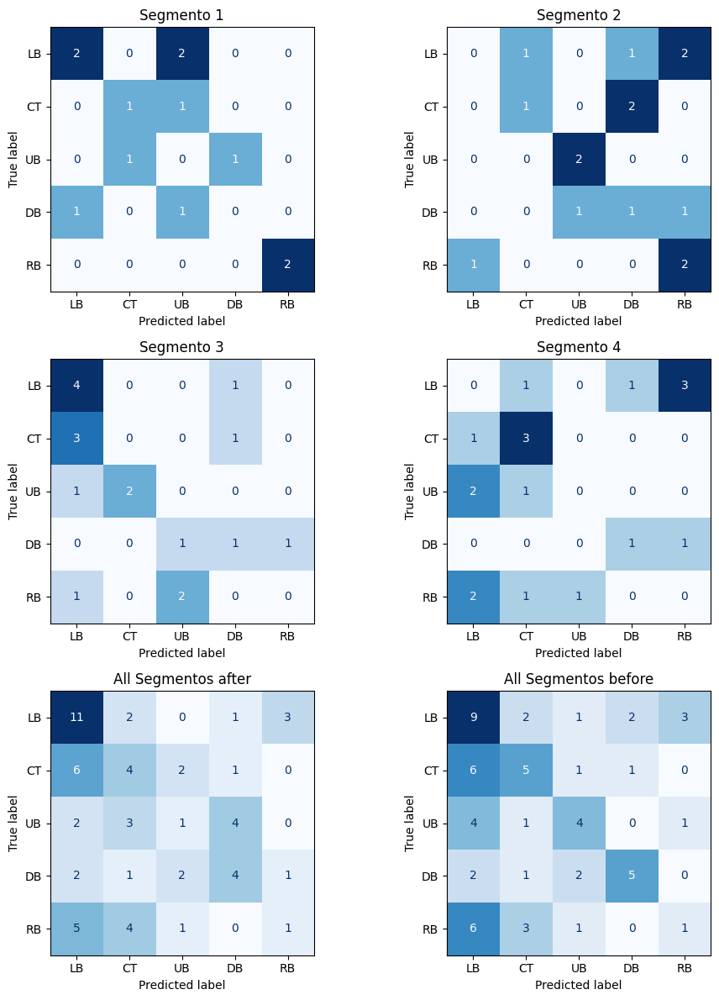

,TREE_VAL
Segmento 1,0.416667
Segmento 2,0.400000
Segmento 3,0.222222
Segmento 4,0.333333
All Segmentos after,0.245902
All Segmentos before,0.213115


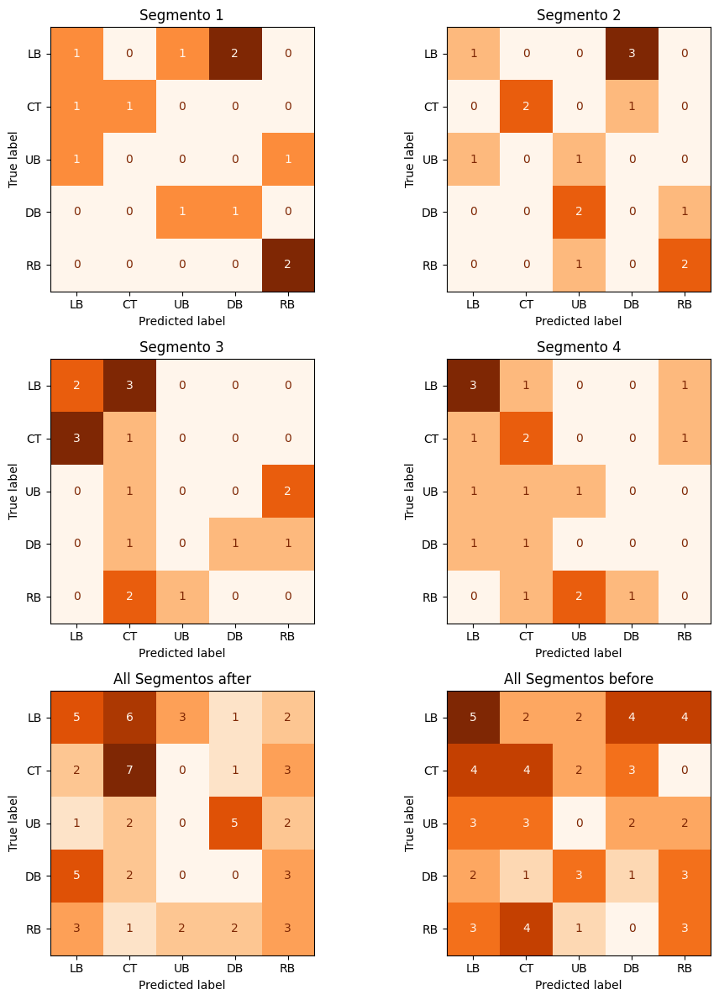

,RANDOM_VAL
Segmento 1,0.416667
Segmento 2,0.333333
Segmento 3,0.388889
Segmento 4,0.166667
All Segmentos after,0.295082
All Segmentos before,0.229508


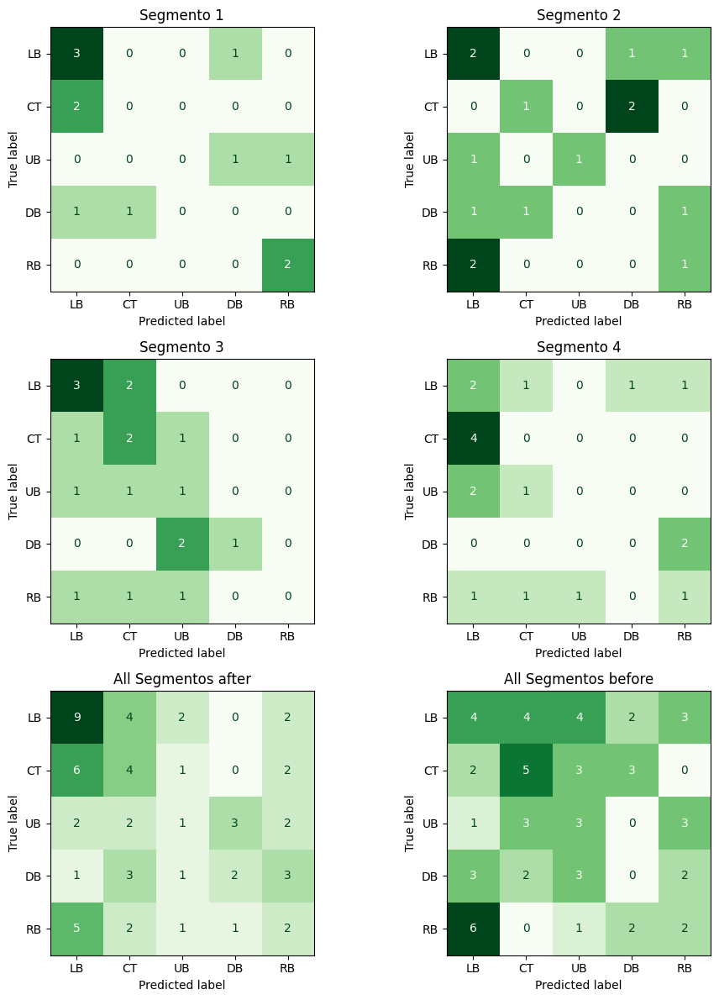

HoldOut                    
                           KNN      TREE    RANDOM
Segmento 1            0.416667  0.416667  0.416667
Segmento 2            0.400000  0.400000  0.333333
Segmento 3            0.277778  0.222222  0.388889
Segmento 4            0.222222  0.333333  0.166667
All Segmentos after   0.344262  0.245902  0.295082
All Segmentos before  0.393443  0.213115  0.229508

KFold-CrossVal                    
                                KNN      TREE    RANDOM
Segmento 1                 0.150000  0.000000  0.150000
Segmento 2                 0.000000  0.250000  0.250000
Segmento 3                 0.100000  0.350000  0.050000
Segmento 4                 0.250000  0.050000  0.050000
All Segmentos after        0.242857  0.309524  0.311905
All Segmentos before       0.245238  0.192857  0.209524

Leave-1-out                    
                             KNN      TREE    RANDOM
Segmento 1              0.166667  0.166667  0.000000
Segmento 2              0.000000  0.266667  0.133333
Segmento 3              0.111111  0.333333  0.277778
Segmento 4              0.222222  0.000000  0.111111
All Segmentos after     0.229508  0.229508  0.262295
All Segmentos before    0.229508  0.180328  0.245902

Datos Evaluación


Datos Test


In [36]:
%run 7.MachineLearning.ipynb

## 8. Implementación modelos Deep Learning

### 8.1 MLP

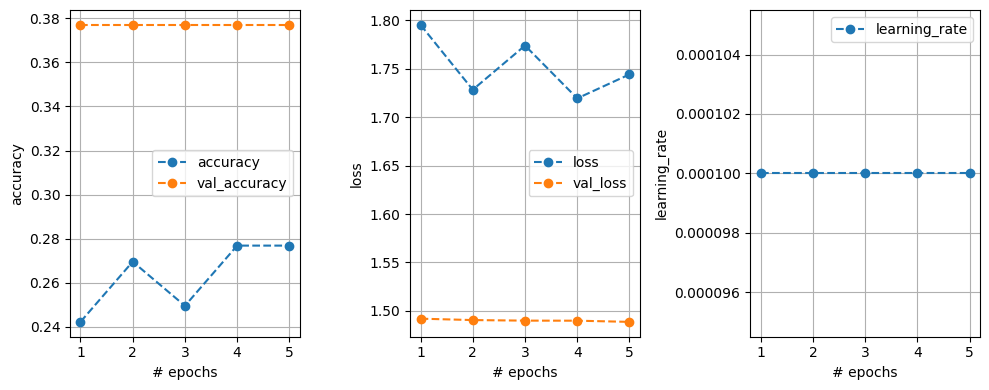

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.3039 - loss: 1.6794 - val_accuracy: 0.3770 - val_loss: 1.4887 - learning_rate: 1.0000e-04
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


,MLP_VAL
Segmento 1,0.416667
Segmento 2,0.200000
Segmento 3,0.277778
Segmento 4,0.166667
All Segmentos after,0.393443
All Segmentos before,0.377049


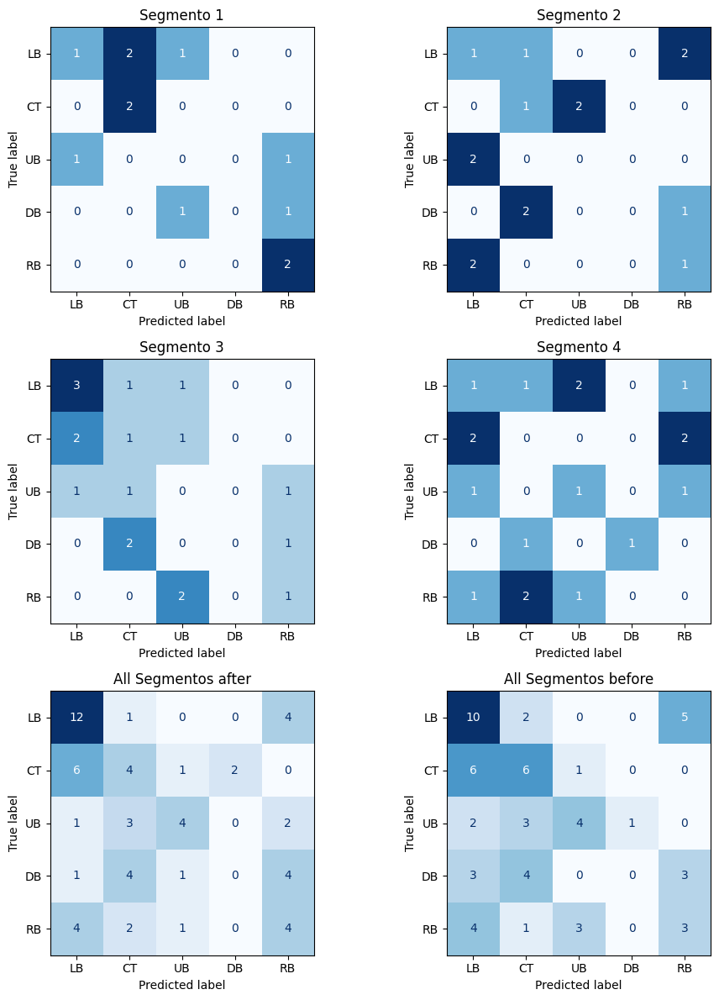

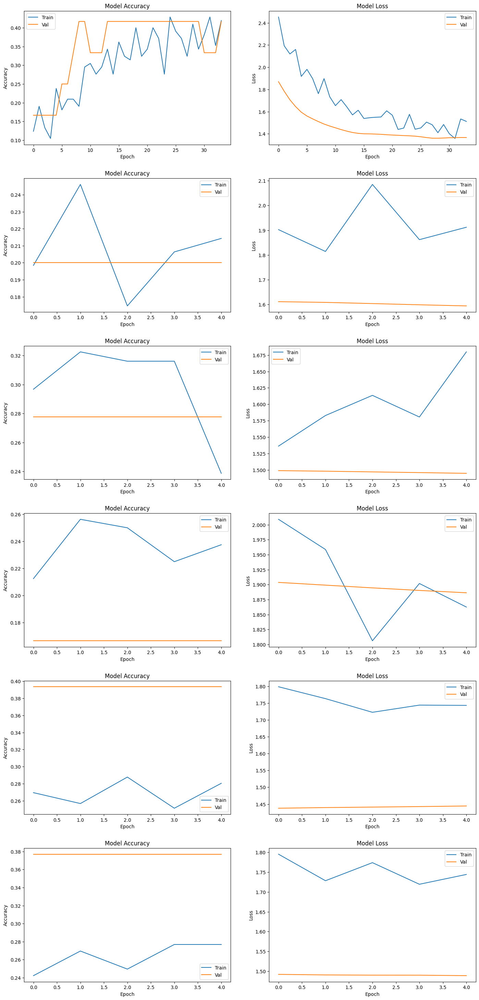

,MLP_TEST
Segmento 1,0.615385
Segmento 2,0.375000
Segmento 3,0.300000
Segmento 4,0.300000
All Segmentos after,0.367647
All Segmentos before,0.308824


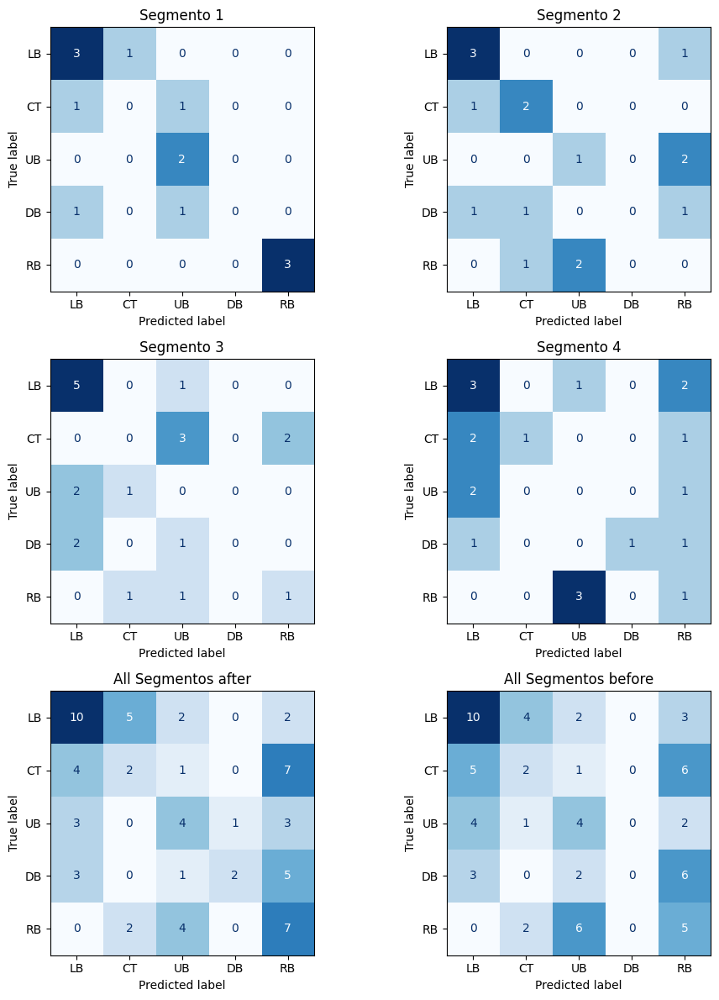

In [37]:
%run 8.1.DeepLearning-MLP.ipynb

### 8.2 SRNN

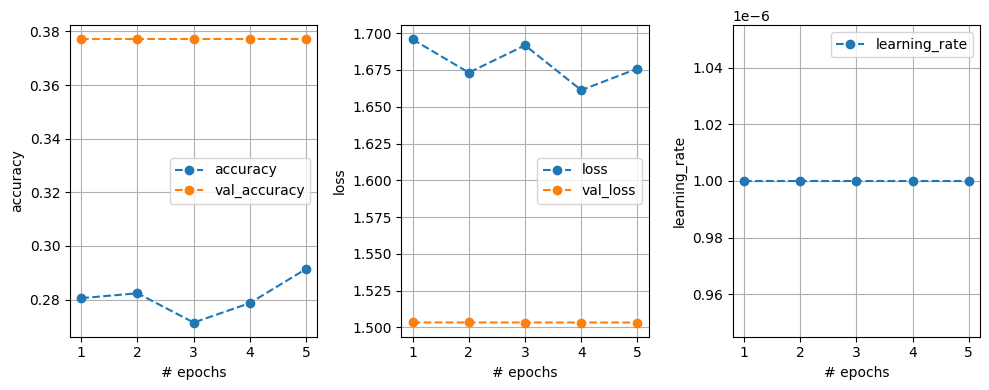

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.2747 - loss: 1.7436 - val_accuracy: 0.3770 - val_loss: 1.5033 - learning_rate: 1.0000e-06
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


,RNN_VAL
Segmento 1,0.333333
Segmento 2,0.400000
Segmento 3,0.277778
Segmento 4,0.166667
All Segmentos after,0.360656
All Segmentos before,0.377049


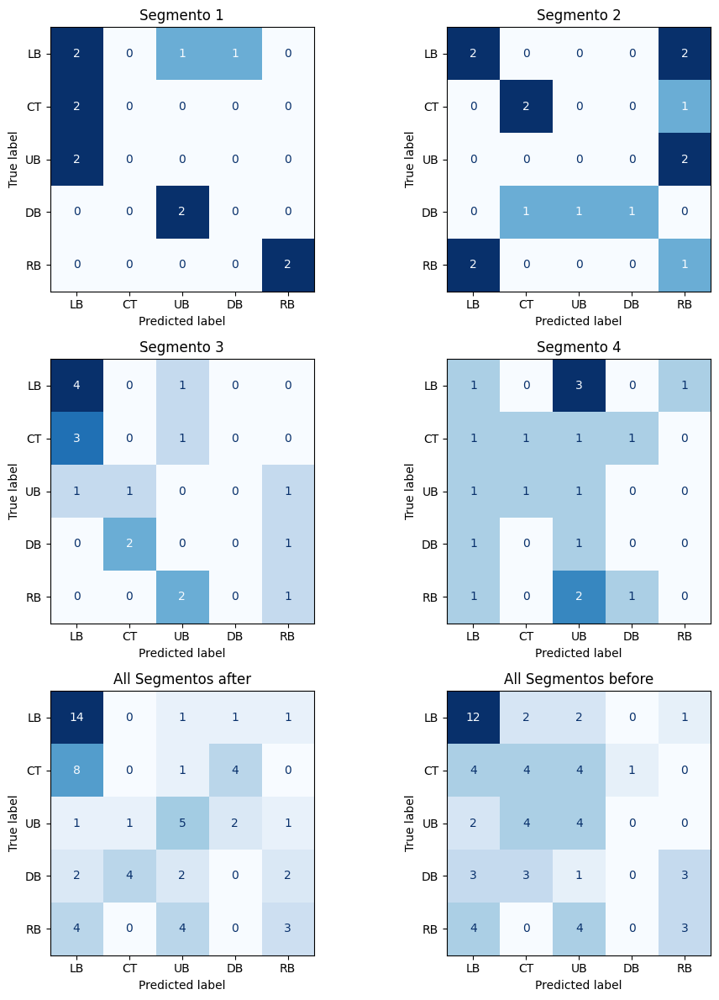

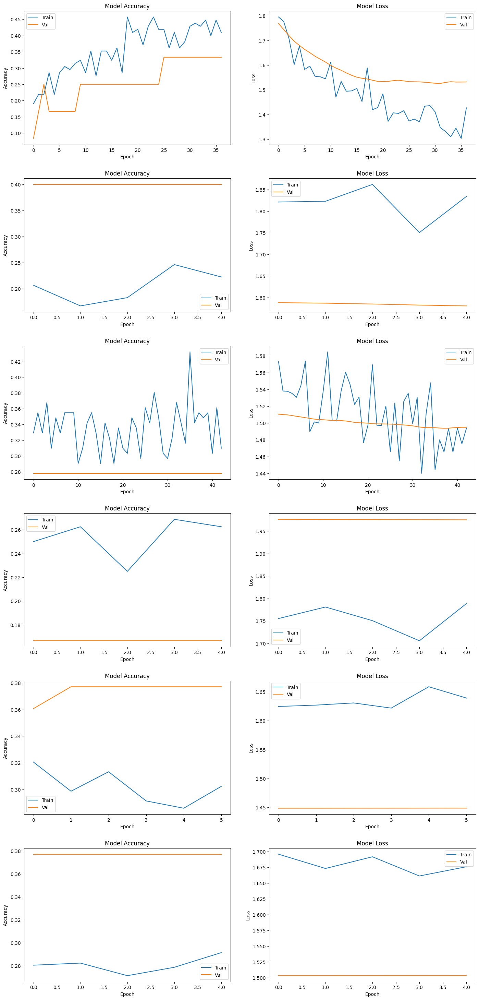

,RNN_TEST
Segmento 1,0.615385
Segmento 2,0.312500
Segmento 3,0.350000
Segmento 4,0.350000
All Segmentos after,0.308824
All Segmentos before,0.294118


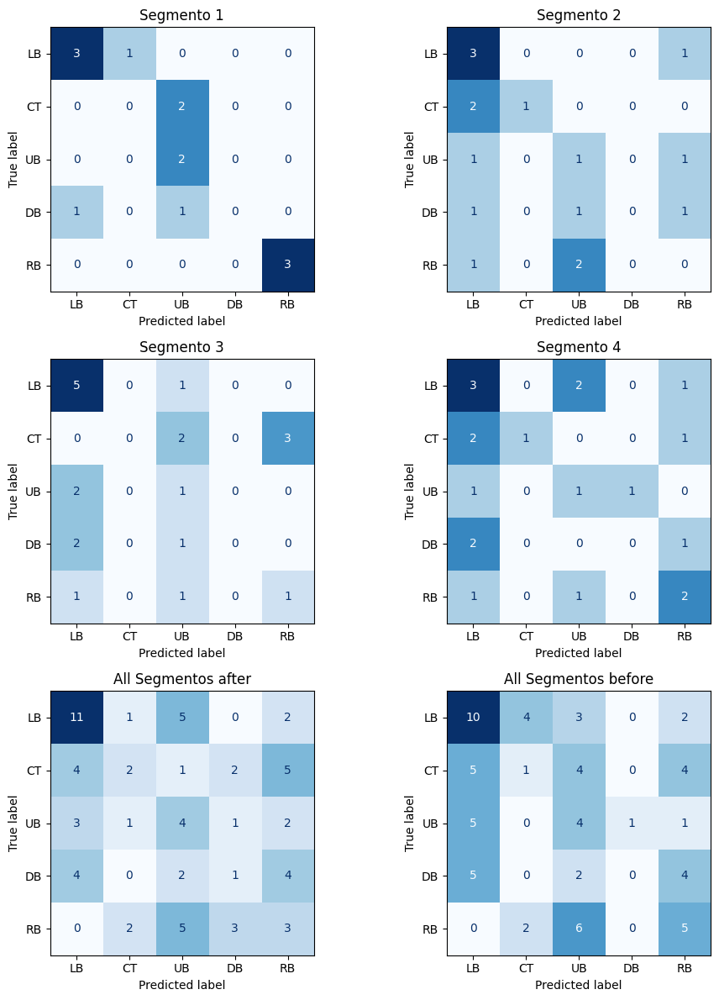

In [38]:
%run 8.2.DeepLearning-RNN.ipynb

### 8.3 LSTM

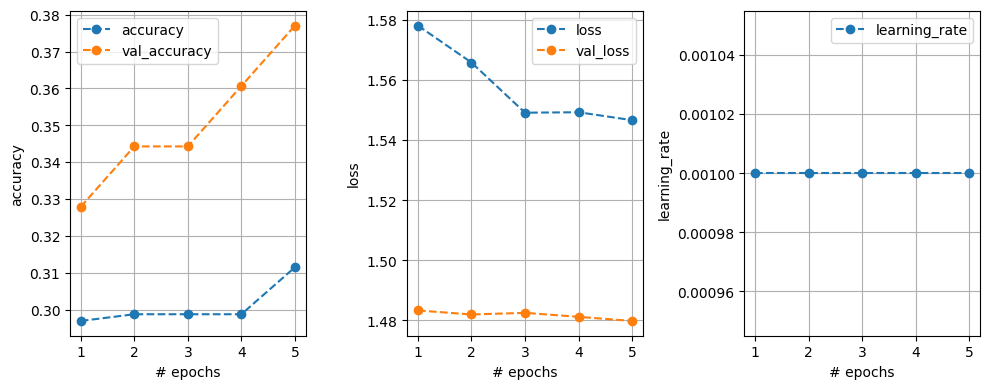

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.3344 - loss: 1.5344 - val_accuracy: 0.3770 - val_loss: 1.4798 - learning_rate: 0.0010
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


,LSTM_VAL
Segmento 1,0.416667
Segmento 2,0.200000
Segmento 3,0.277778
Segmento 4,0.111111
All Segmentos after,0.360656
All Segmentos before,0.327869


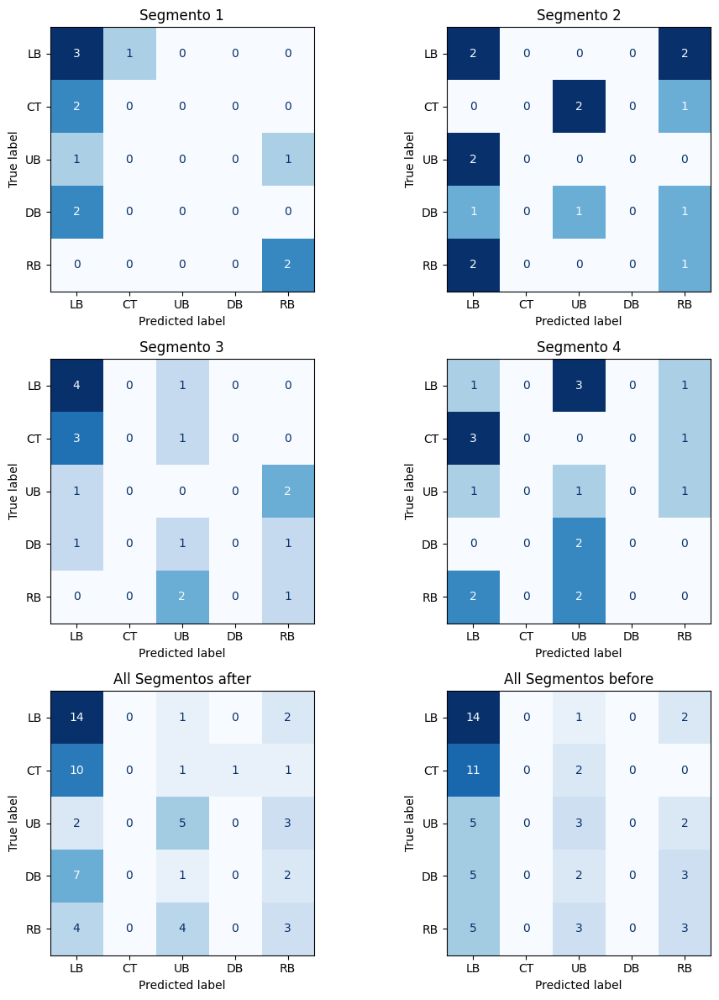

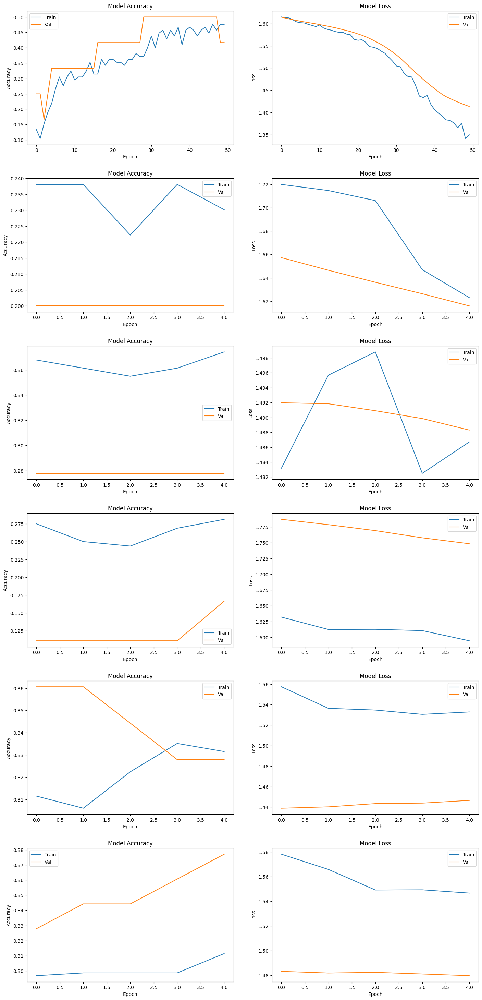

,LSTM_TEST
Segmento 1,0.538462
Segmento 2,0.250000
Segmento 3,0.350000
Segmento 4,0.350000
All Segmentos after,0.338235
All Segmentos before,0.323529


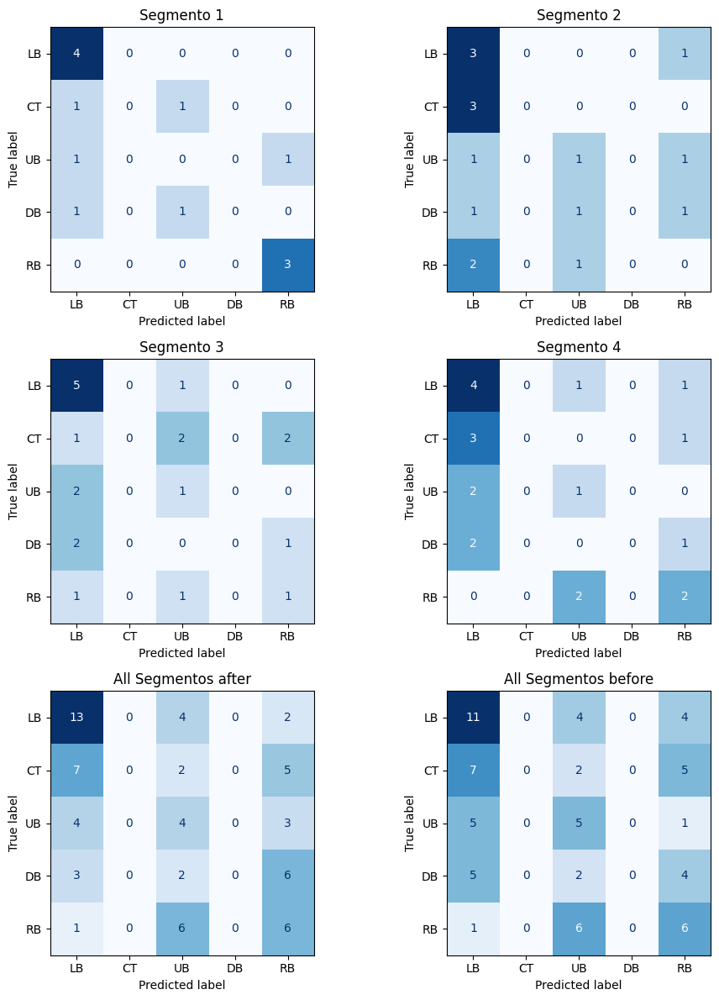

In [39]:
%run 8.3.DeepLearning-LSTM.ipynb

### 8.4 SRNN Sliding Windows

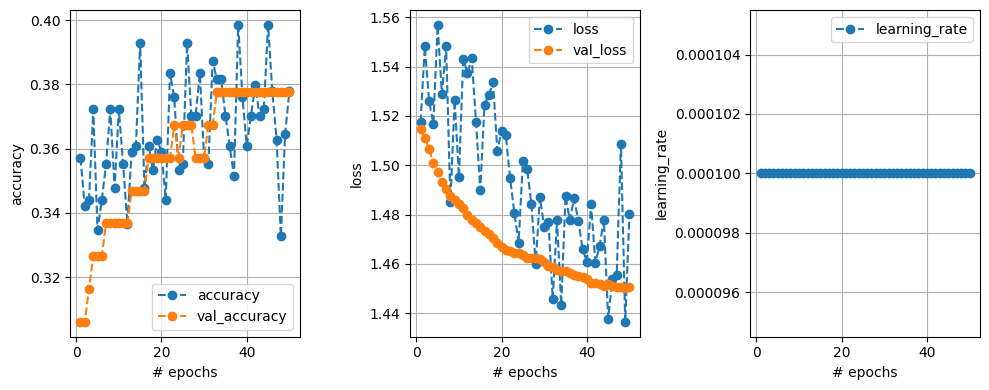

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.3729 - loss: 1.5091 - val_accuracy: 0.3776 - val_loss: 1.4507 - learning_rate: 1.0000e-04
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


,RNN_SW_VAL
All Segmentos after,0.336735
All Segmentos before,0.377551


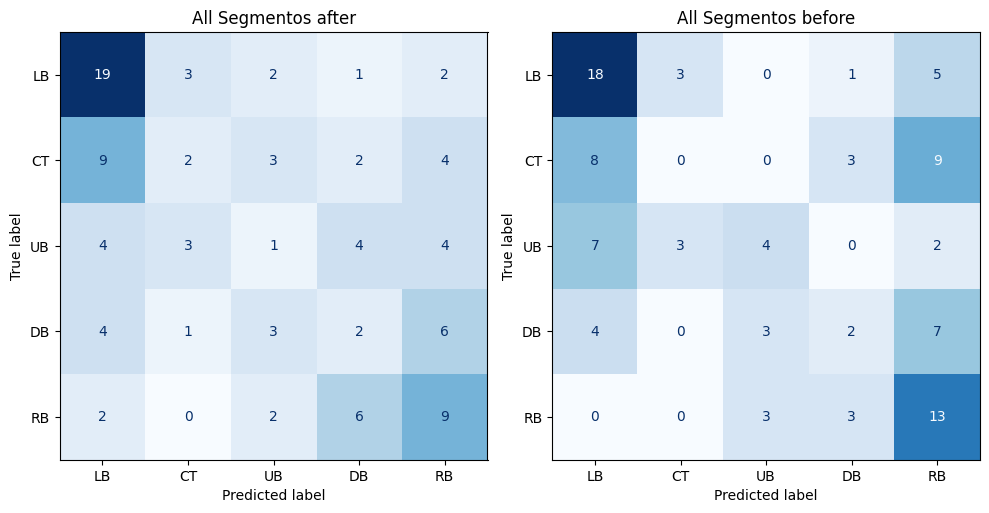

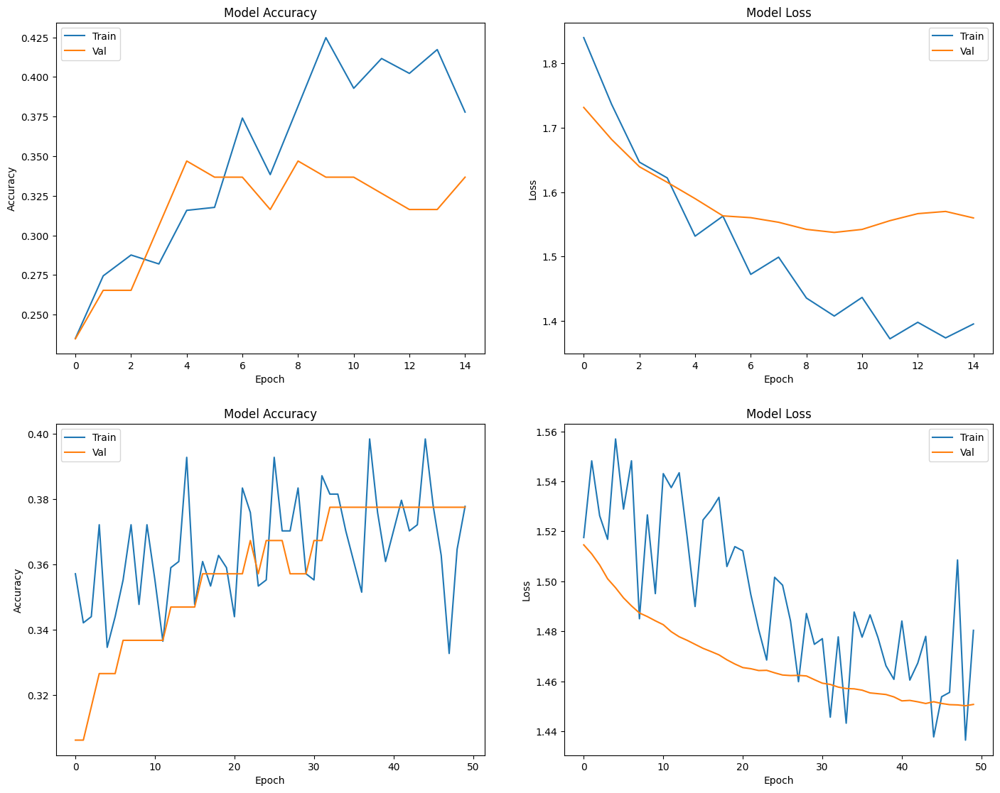

,RNN_SW_TEST
All Segmentos after,0.222222
All Segmentos before,0.277778


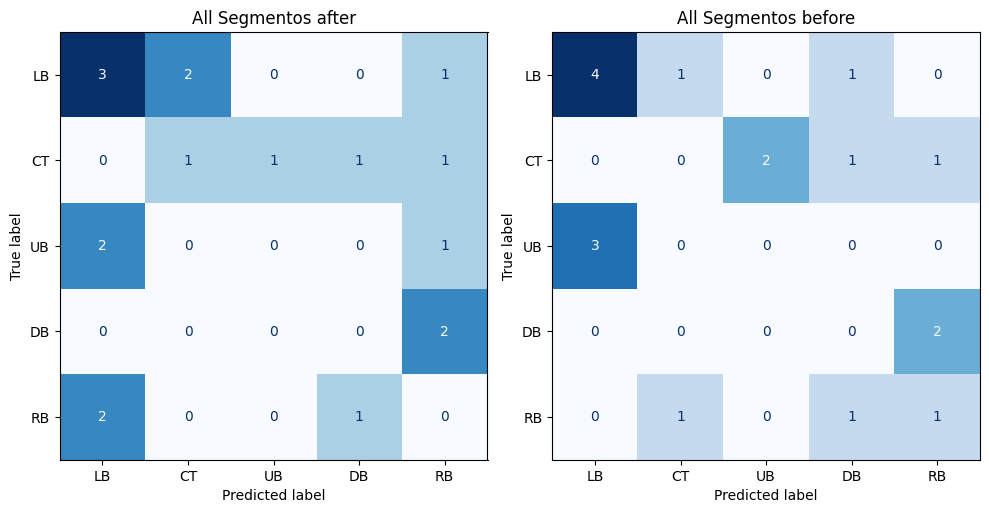

In [40]:
%run 8.4.DeepLearning-RNN(SlidingWindows).ipynb

### 8.5 LSTM Sliding Windows

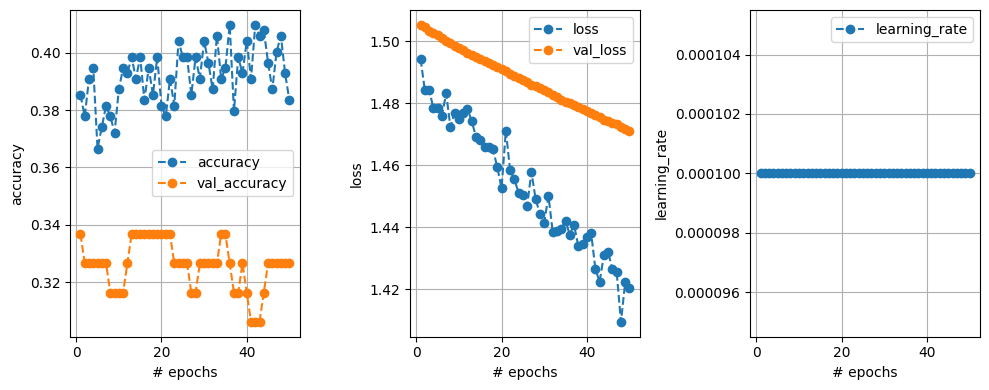

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.4043 - loss: 1.4154 - val_accuracy: 0.3265 - val_loss: 1.4709 - learning_rate: 1.0000e-04
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


,LSTM_SW_VAL
All Segmentos after,0.295918
All Segmentos before,0.326531


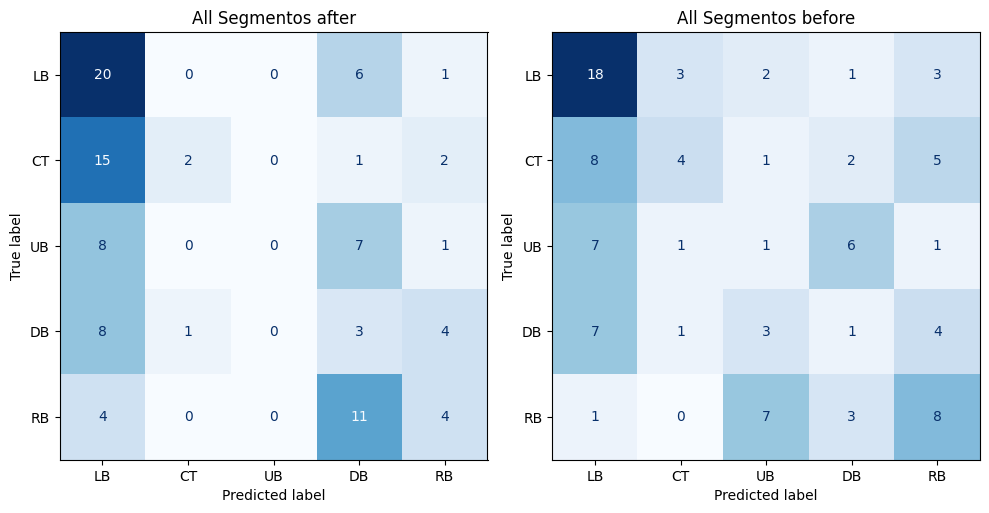

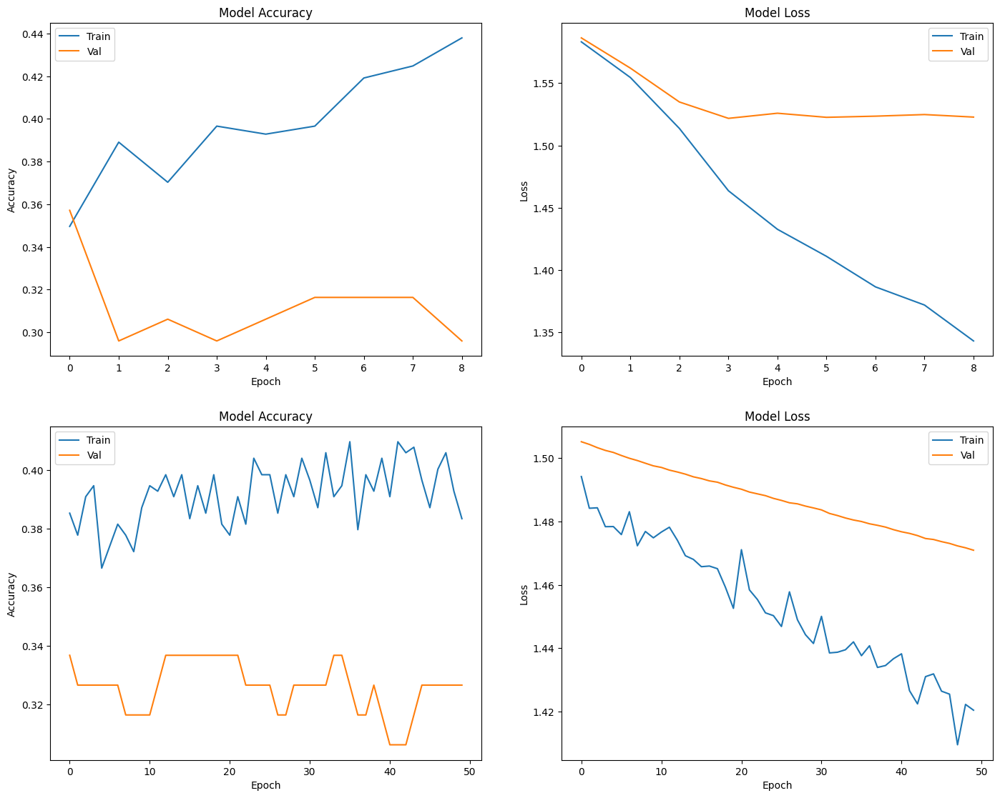

,LSTM_SW_TEST
All Segmentos after,0.222222
All Segmentos before,0.222222


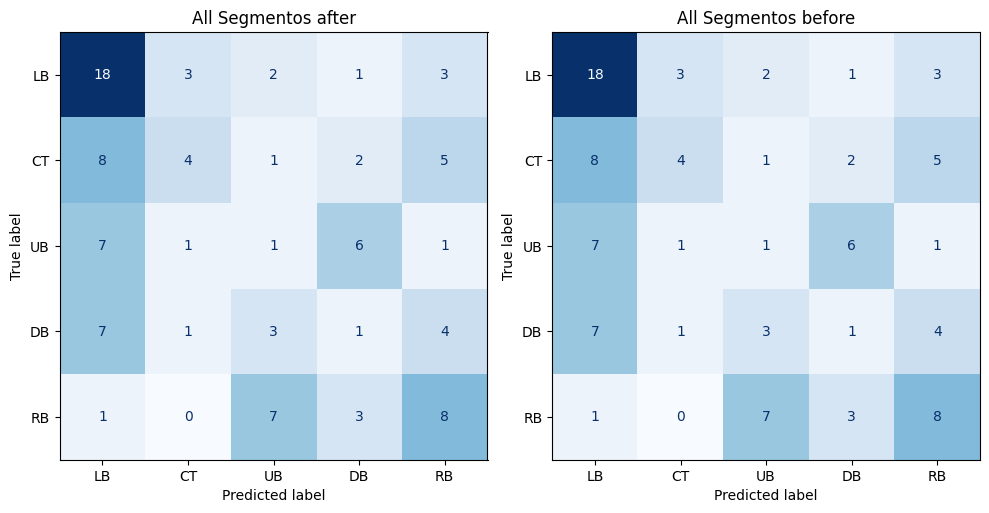

In [41]:
%run 8.5.DeepLearning-LSTM(SlidingWindows).ipynb

## 9. Comportamiento de modelos SRNN y LSTM con generacion de datos sintéticos

### 9.1 Aumento de datos con SMOTE

Tamaño del DataFramedatos datosEEG_std_after_resampled resultante con sobremuestreo: (3000, 11)
Tamaño del DataFramedatos datosEEG_std_before_resampled resultante con sobremuestreo: (3000, 11)
Tamaño del DataFramedatos datosEEG_std_tres_segmentos resultante con sobremuestreo: (3000, 11)


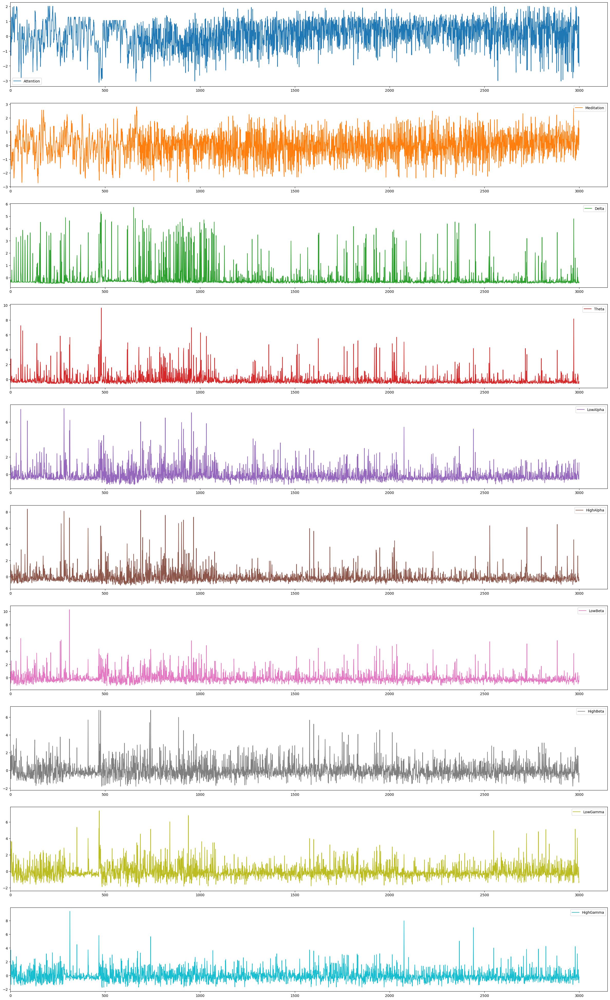

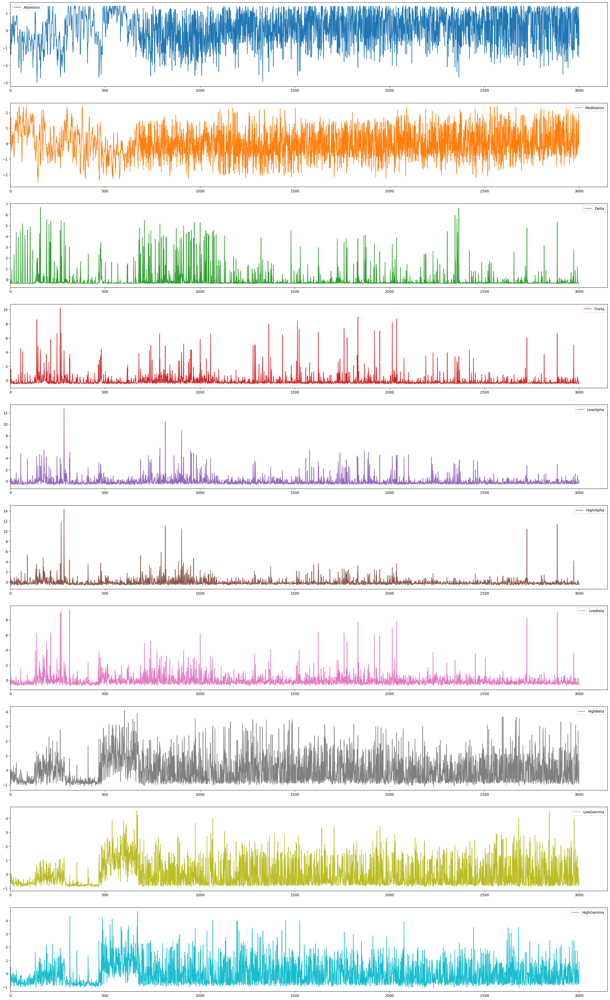

In [42]:
%run  9.1.ProcesadoAumentoDatosSmote.ipynb

### 9.2 SRNN Aumento de datos

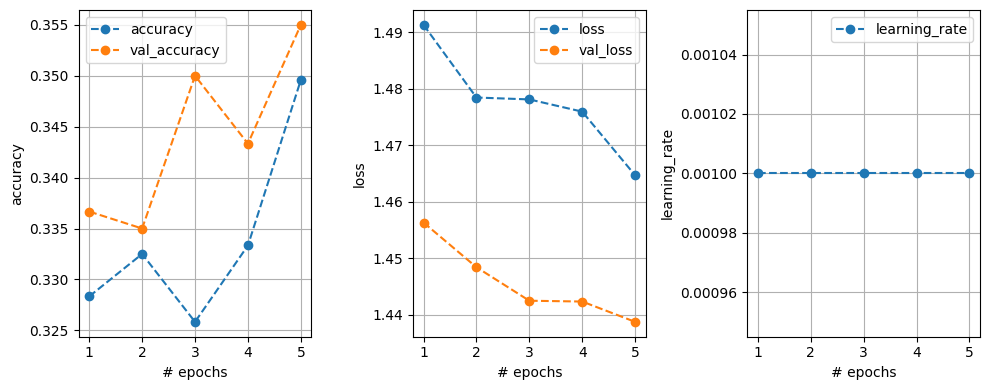

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3648 - loss: 1.4547 - val_accuracy: 0.3550 - val_loss: 1.4387 - learning_rate: 0.0010
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


,RNN_RS_VAL
All Segmentos after,0.370370
All Segmentos before,0.296296
Test Datos Reales,0.336667


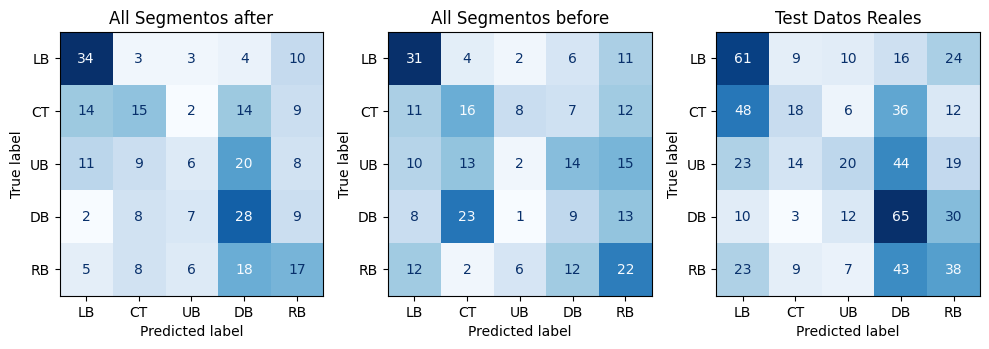

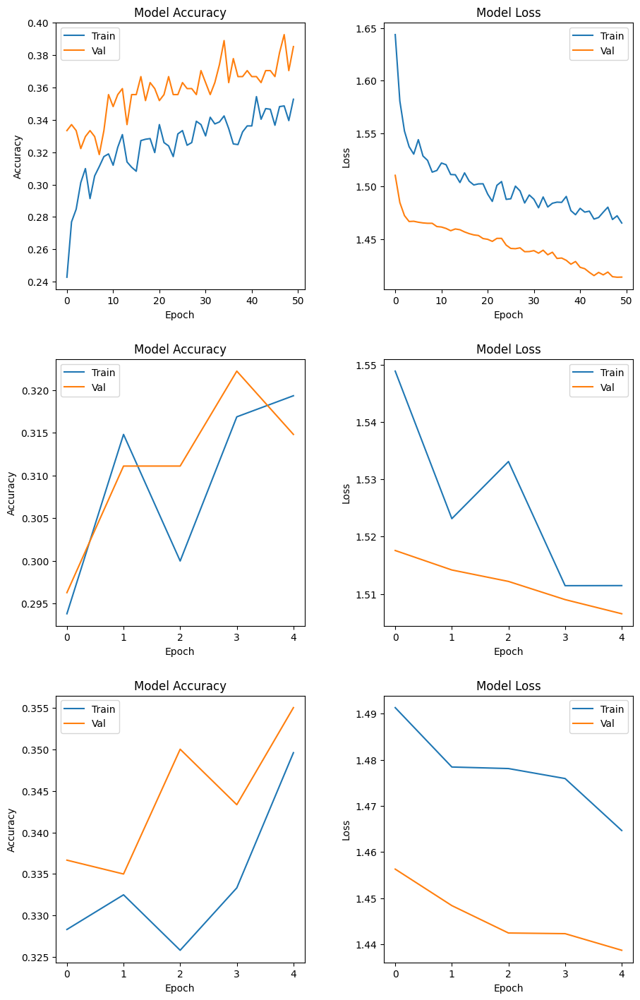

,RNN_RS_TEST
All Segmentos after,0.313333
All Segmentos before,0.290000
Test Datos Reales,0.446154


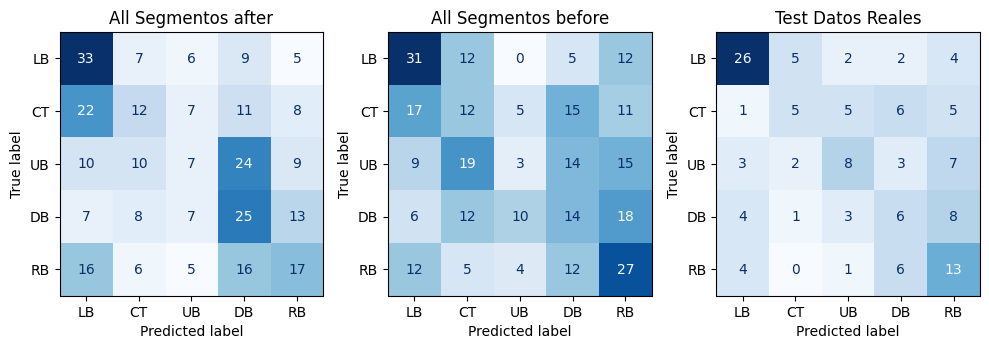

In [43]:
%run  9.2.DeepLearning-RNN(AumentoDatos).ipynb

### 9.3 LSTM Aumento de datos

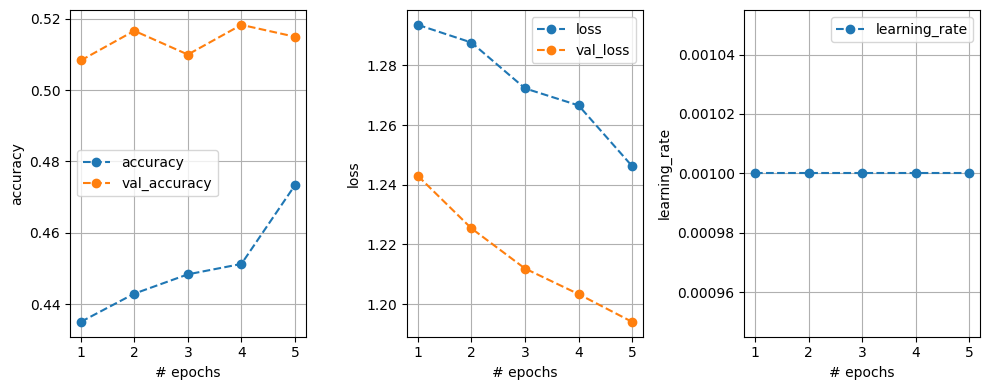

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4672 - loss: 1.2478 - val_accuracy: 0.5150 - val_loss: 1.1940 - learning_rate: 0.0010
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


,LSTM_RS_VAL
All Segmentos after,0.503704
All Segmentos before,0.388889
Test Datos Reales,0.508333


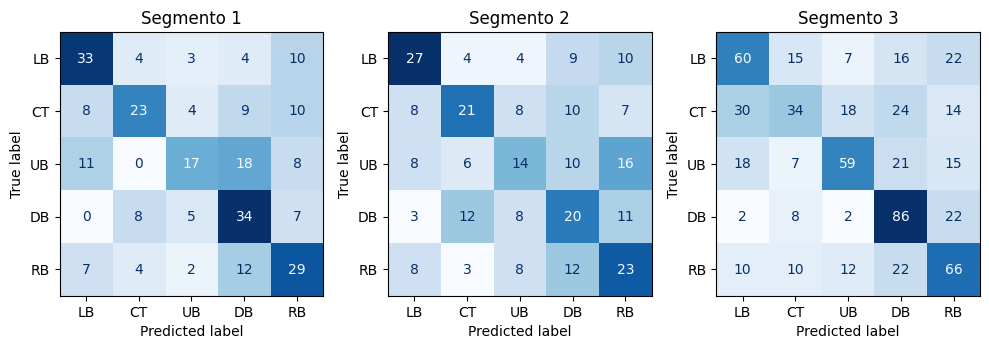

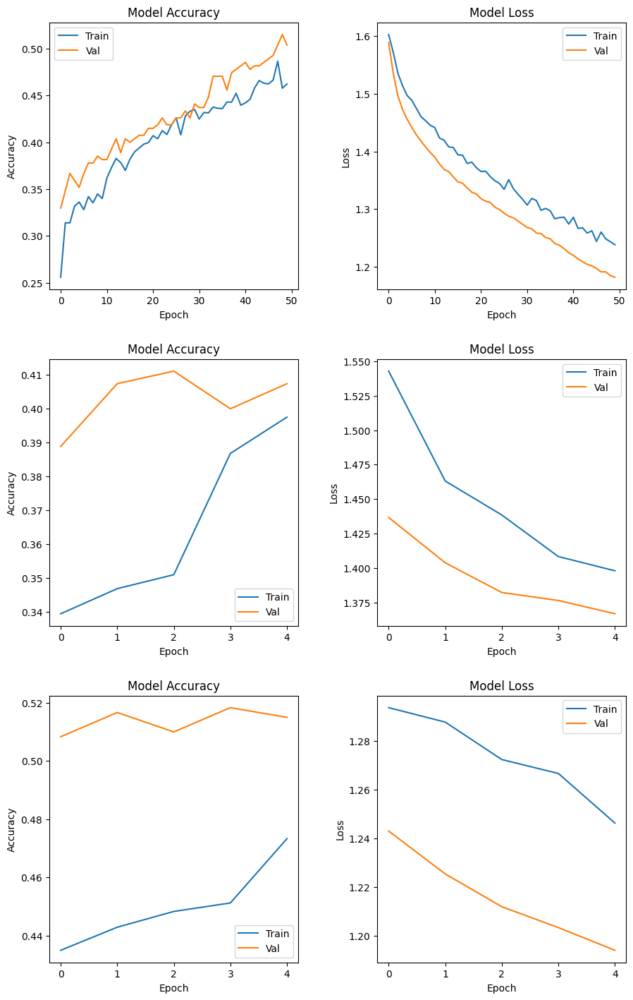

,LSTM_RS_TEST
All Segmentos after,0.463333
All Segmentos before,0.346667
Test Datos Reales,0.484615


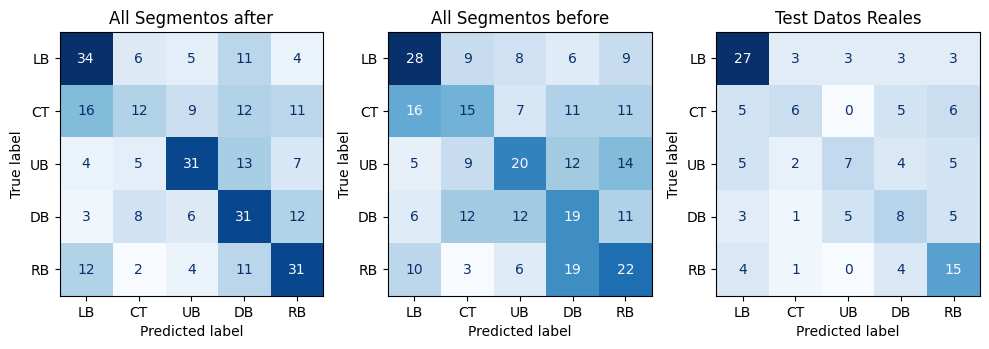

In [44]:
%run  9.3.DeepLearning-LSTM(AumentoDatos).ipynb

### 9.4 SRNN Aumento de datos Sliding Windows 

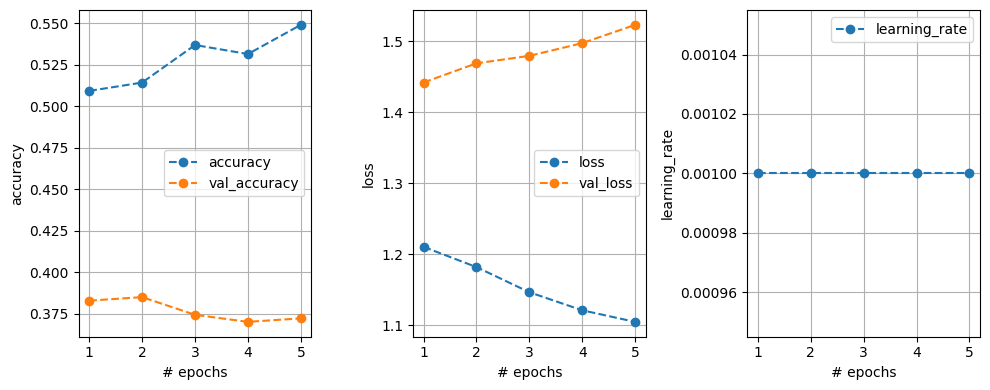

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5369 - loss: 1.1132 - val_accuracy: 0.3723 - val_loss: 1.5229 - learning_rate: 0.0010
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


,RNN_RS_SW_VAL
All Segmentos after,0.570213
All Segmentos before,0.389362
Test Datos Reales,0.382979


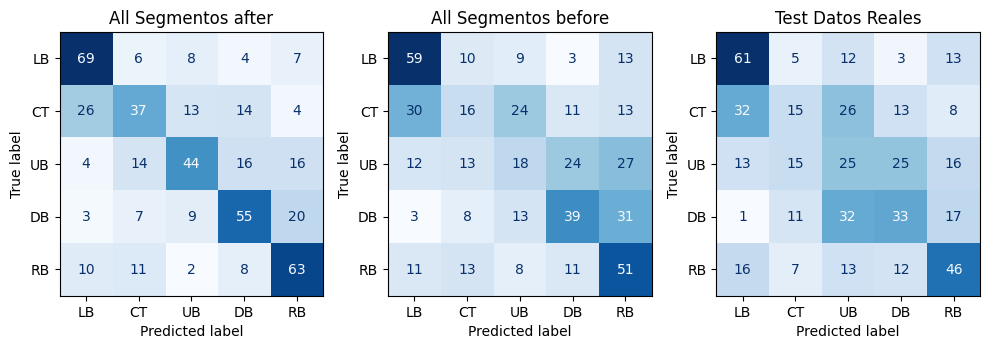

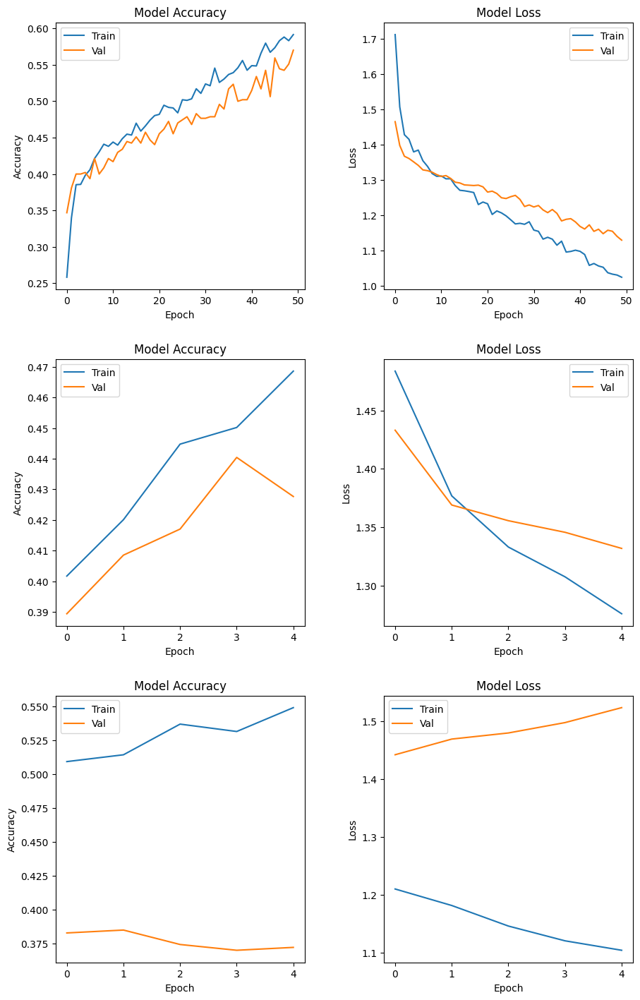

,RNN_RS_SW_TEST
All Segmentos after,0.627273
All Segmentos before,0.545455
Test Datos Reales,0.525000


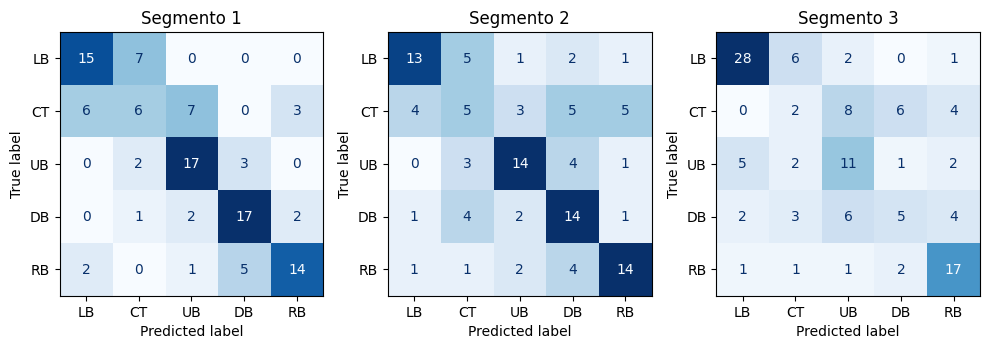

In [45]:
%run 9.4.DeepLearning-RNN(AumentoDatosSlidingWindows).ipynb

### 9.5 LSTM Aumento de datos Sliding Windows 

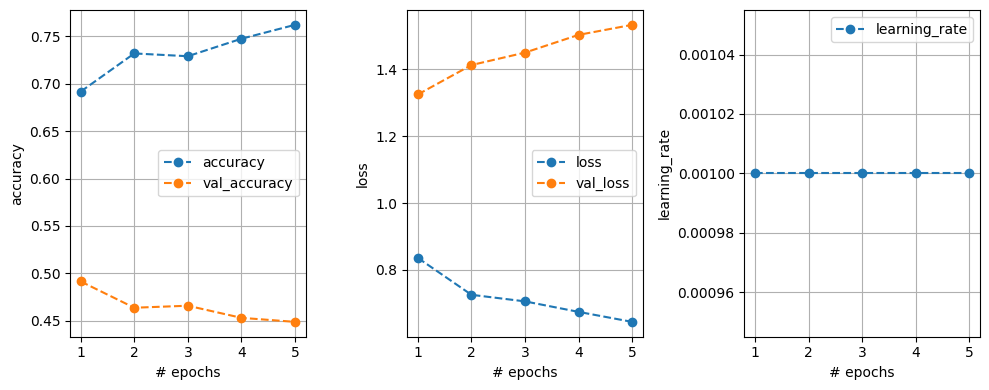

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7711 - loss: 0.6263 - val_accuracy: 0.4489 - val_loss: 1.5329 - learning_rate: 0.0010
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


,LSTM_RS_SW_VAL
All Segmentos after,0.727660
All Segmentos before,0.514894
Test Datos Reales,0.491489


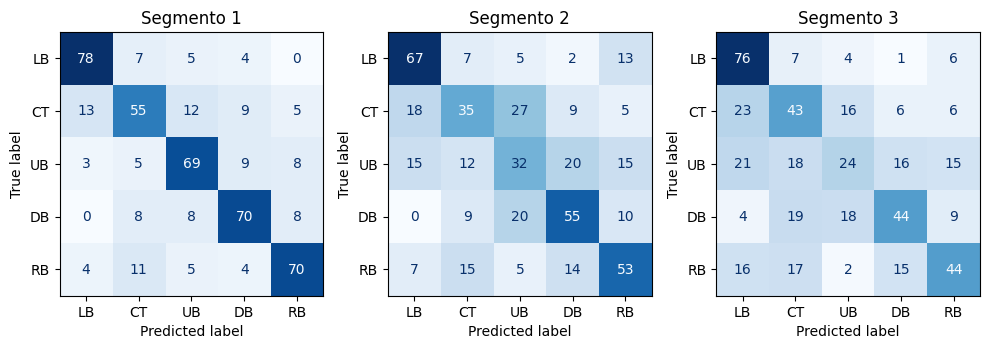

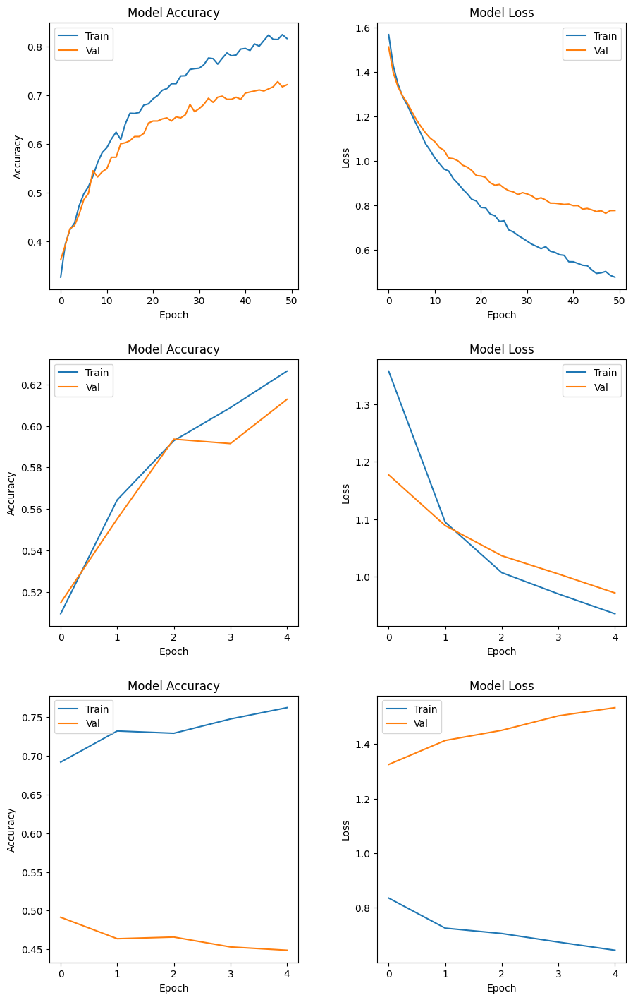

,LSTM_RS_SW_TEST
All Segmentos after,0.836364
All Segmentos before,0.609091
Test Datos Reales,0.641667


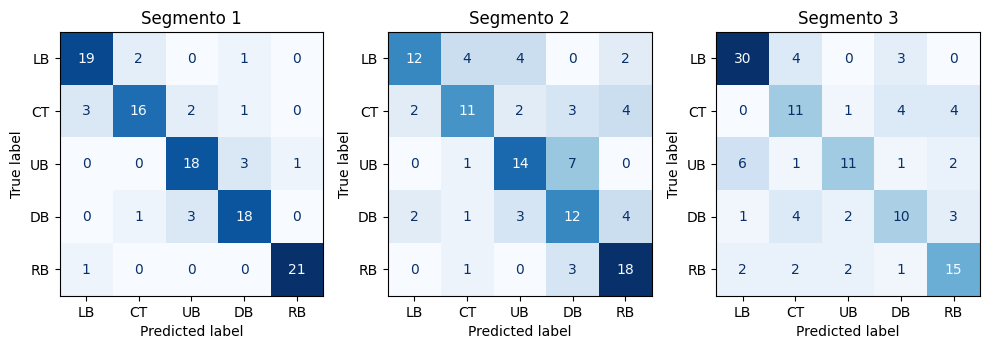

In [46]:
%run 9.5.DeepLearning-LSTM(AumentoDatosSlidingWindows).ipynb

# Notebook recopilado de resultados

### 10. Recopilado de resultados

In [47]:
%run 10.Resultadosconjuntodatostest.ipynb

,KNN_VAL,TREE_VAL,RANDOM_VAL,MLP_VAL,RNN_VAL,LSTM_VAL
Segmento 1,0.416667,0.416667,0.416667,0.416667,0.333333,0.416667
Segmento 2,0.400000,0.400000,0.333333,0.200000,0.400000,0.200000
Segmento 3,0.277778,0.222222,0.388889,0.277778,0.277778,0.277778
Segmento 4,0.222222,0.333333,0.166667,0.166667,0.166667,0.111111
All Segmentos after,0.344262,0.245902,0.295082,0.393443,0.360656,0.360656
All Segmentos before,0.393443,0.213115,0.229508,0.377049,0.377049,0.327869


,RNN_SW_VAL,LSTM_SW_VAL
All Segmentos after,0.336735,0.295918
All Segmentos before,0.377551,0.326531


,RNN_RS_VAL,LSTM_RS_VAL,RNN_RS_SW_VAL,LSTM_RS_SW_VAL
All Segmentos after,0.370370,0.503704,0.570213,0.727660
All Segmentos before,0.296296,0.388889,0.389362,0.514894
Test a datos reales,0.336667,0.508333,0.382979,0.491489


,KNN_TEST,TREE_TEST,RANDOM_TEST,MLP_TEST,RNN_TEST,LSTM_TEST
Segmento 1,0.692308,0.538462,0.538462,0.615385,0.615385,0.538462
Segmento 2,0.500000,0.375000,0.312500,0.375000,0.312500,0.250000
Segmento 3,0.400000,0.200000,0.200000,0.300000,0.350000,0.350000
Segmento 4,0.200000,0.300000,0.150000,0.300000,0.350000,0.350000
All Segmentos after,0.279412,0.338235,0.250000,0.367647,0.308824,0.338235
All Segmentos before,0.250000,0.308824,0.235294,0.308824,0.294118,0.323529


,RNN_SW_TEST,LSTM_SW_TEST
All Segmentos after,0.222222,0.222222
All Segmentos before,0.277778,0.222222


,RNN_RS_TEST,LSTM_RS_TEST,RNN_RS_SW_TEST,LSTM_RS_SW_TEST
All Segmentos after,0.313333,0.463333,0.627273,0.836364
All Segmentos before,0.290000,0.346667,0.545455,0.609091
Test a datos reales,0.446154,0.484615,0.525000,0.641667


In [48]:
fin_tiempo = time.time()

tiempo_utilizado = fin_tiempo - inicio_tiempo

# Convierto el tiempo a horas, minutos y segundos para saber cuanto tarda la ejecucion
horas = int(tiempo_utilizado // 3600)
minutos = int((tiempo_utilizado % 3600) // 60)
segundos = int(tiempo_utilizado % 60)
print(f"Tiempo: {horas} : {minutos} : {segundos}")

Tiempo: 0 : 9 : 2
